In [1]:
# window 15로 돌려보자

In [1]:
# 모듈 import
from datetime import datetime
import numpy as np
import os
import pandas as pd

#from google.colab import drive
#drive.mount('/content/gdrive')
#os.chdir('/content/gdrive/MyDrive/python/python_dong/data_axis_transform1')

import torch
import torch.nn as nn
from torch import optim
import torch.nn.functional as F
from torch.autograd import Variable

#!pip install torchmetrics
import torchmetrics

#!pip install torchinfo
from torchinfo import summary

import matplotlib.pyplot as plt
import math


device = torch.device("cuda" if torch.cuda.is_available() else "cpu")



# 1. 데이터 전처리

In [2]:
# data path 지정
raw_data_path = './data/stocknet-dataset/price/raw'

if 'stocknet' in raw_data_path:
    tra_date = '2014-01-02'
    val_date = '2015-08-03'
    tes_date = '2015-10-01'
    end_date = '2015-12-31'
elif 'kdd17' in raw_data_path:
    tra_date = '2007-01-03'
    val_date = '2015-01-02'
    tes_date = '2016-01-04'
    end_date = '2016-12-31'
else:
    print('unexpected path: %s' % raw_data_path)

# os.path.isfile : 파일이 있는지 없는 지 체크
# os.path.join(data_path, fname) : 폴더 디렉터리와 fname(stockname.csv) 붙임
fnames = [fname for fname in os.listdir(raw_data_path) if
            os.path.isfile(os.path.join(raw_data_path,fname))]

COLUMNS_FEATURE_DATA_V1 = ['open_close_ratio', 'high_close_ratio', 
                           'low_close_ratio', 'close_lastclose_ratio', 
                           'adjclose_lastadjclose_ratio', 'close_ma5_ratio', 
                           'close_ma10_ratio', 'close_ma15_ratio', 'close_ma20_ratio', 
                           'close_ma25_ratio', 'close_ma30_ratio']

ver = 'v1' # ver in ['v1', 'v2']
if ver == 'v1':
    COLUMNS_FEATURE = COLUMNS_FEATURE_DATA_V1

In [3]:
windows = [5,10,15,20,25,30]

def preprocess(df, windows):
   '''
   전처리 함수 역할 : 전체 feature생성하여 df column에 추가
   '''
   data = df
   data['open_close_ratio'] = data['Open'] / data['Close'] - 1
   data['high_close_ratio'] = data['High'] / data['Close'] - 1
   data['low_close_ratio'] = data['Low'] / data['Close'] - 1

   data['close_lastclose_ratio'] = np.zeros(len(data))
   data.loc[1:, 'close_lastclose_ratio'] = data['Close'][1:].values / data['Close'][:-1].values - 1

   data['adjclose_lastadjclose_ratio'] = np.zeros(len(data))
   data.loc[1:, 'adjclose_lastadjclose_ratio'] = data['Adj Close'][1:].values / data['Adj Close'][:-1].values - 1

   for window in windows:
      data[f'close_ma{window}_ratio'] = data['Adj Close'].rolling(window).mean()/data['Adj Close'] - 1
   
   data['label'] = np.append((data['Close'][1:].values > data['Close'][:-1].values)*1,0)

   return data

In [4]:
feature_data_path = './data/stocknet-dataset/price/feature'

for fname in fnames:
   if not os.path.isfile(os.path.join(feature_data_path,fname)):
      df_raw = pd.read_csv(os.path.join(raw_data_path,fname))
      data = preprocess(df_raw, windows)

      # 폴더 없으면 생성
      try:
         if not os.path.exists(feature_data_path):
            os.makedirs(feature_data_path)
      except OSError:
         print ('Error: Creating directory. ' +  feature_data_path)

      #csv 파일 저장
      data.to_csv(os.path.join(feature_data_path,fname))



# train, validation, test data 나누기

## 1. input data 3차원으로 쌓기
shape = (stock 종류수, date, feature)



요건
1. 모든 티커 데이터의 date가 맞는지?
2. 결측치는 없는지?
3. 티커와 데이터 메치 가능해야함

In [5]:
raw_data_path = './data/stocknet-dataset/price/raw'


tra_data_X = []
tra_data_Y = []
val_data_X = []
val_data_Y = []
test_data_X = []
test_data_Y = []
tickers = []

cnt = 0
fail_cnt = 0

fnames = [fname for fname in os.listdir(raw_data_path) if
            os.path.isfile(os.path.join(raw_data_path,fname))]

for fname in fnames:

    df = pd.read_csv(os.path.join(raw_data_path,fname))
    data = preprocess(df, windows)

    learning_data = data[(data['Date'] >= tra_date) & (data['Date'] <= end_date)]['Date']
    tra_data_X_ticker = data[(data['Date'] >= tra_date) & (data['Date'] < val_date)][COLUMNS_FEATURE]
    tra_data_Y_ticker = data[(data['Date'] >= tra_date) & (data['Date'] < val_date)]['label']

    val_data_X_ticker = data[(data['Date'] >= val_date) & (data['Date'] < tes_date)][COLUMNS_FEATURE]
    val_data_Y_ticker = data[(data['Date'] >= val_date) & (data['Date'] < tes_date)]['label']

    test_data_X_ticker = data[(data['Date'] >= tes_date) & (data['Date'] <= end_date)][COLUMNS_FEATURE]
    test_data_Y_ticker = data[(data['Date'] >= tes_date) & (data['Date'] <= end_date)]['label']


    if cnt == 0:
        target_dates = learning_data
    
    print('ticker : {}, date check : {}'.format(fname, np.array_equal(target_dates.values, learning_data.values)))
    if np.array_equal(target_dates.values, learning_data.values): 
        
        tra_data_X.append(tra_data_X_ticker.values)
        tra_data_Y.append(tra_data_Y_ticker.values)

        val_data_X.append(val_data_X_ticker.values)
        val_data_Y.append(val_data_Y_ticker.values)
        
        test_data_X.append(test_data_X_ticker.values)
        test_data_Y.append(test_data_Y_ticker.values)

        tickers.append(fname)
    else : 
        fail_cnt += 1
    
    cnt += 1

print(cnt, len(fnames))
print('fail_cnt :', fail_cnt)

# 마지막에 index 종목 넣기
raw_data_index_path = './data/stocknet-dataset/price/raw/index'

fname = os.listdir(raw_data_index_path)[0]

df = pd.read_csv(os.path.join(raw_data_index_path,fname))
data = preprocess(df, windows)

learning_data = data[(data['Date'] >= tra_date) & (data['Date'] <= end_date)]['Date']
tra_data_X_ticker = data[(data['Date'] >= tra_date) & (data['Date'] < val_date)][COLUMNS_FEATURE]
tra_data_Y_ticker = data[(data['Date'] >= tra_date) & (data['Date'] < val_date)]['label']

val_data_X_ticker = data[(data['Date'] >= val_date) & (data['Date'] < tes_date)][COLUMNS_FEATURE]
val_data_Y_ticker = data[(data['Date'] >= val_date) & (data['Date'] < tes_date)]['label']

test_data_X_ticker = data[(data['Date'] >= tes_date) & (data['Date'] <= end_date)][COLUMNS_FEATURE]
test_data_Y_ticker = data[(data['Date'] >= tes_date) & (data['Date'] <= end_date)]['label']

print('ticker : {}, date check : {}'.format(fname, np.array_equal(target_dates.values, learning_data.values)))
if np.array_equal(target_dates.values, learning_data.values):
    
    tra_data_X.append(tra_data_X_ticker.values)
    # tra_data_Y.append(tra_data_Y_ticker.values)

    val_data_X.append(val_data_X_ticker.values)
    # val_data_Y.append(val_data_Y_ticker.values)
    
    test_data_X.append(test_data_X_ticker.values)
    # test_data_Y.append(test_data_Y_ticker.values)

    tickers.append(fname)

# tra_data_X

ticker : AAPL.csv, date check : True
ticker : ABB.csv, date check : True
ticker : ABBV.csv, date check : True
ticker : AEP.csv, date check : True
ticker : AGFS.csv, date check : False
ticker : AMGN.csv, date check : True
ticker : AMZN.csv, date check : True
ticker : BA.csv, date check : True
ticker : BABA.csv, date check : False
ticker : BAC.csv, date check : True
ticker : BBL.csv, date check : True
ticker : BCH.csv, date check : True
ticker : BHP.csv, date check : True
ticker : BP.csv, date check : True
ticker : BRK-A.csv, date check : True
ticker : BSAC.csv, date check : True
ticker : BUD.csv, date check : True
ticker : C.csv, date check : True
ticker : CAT.csv, date check : True
ticker : CELG.csv, date check : True
ticker : CHL.csv, date check : True
ticker : CHTR.csv, date check : True
ticker : CMCSA.csv, date check : True
ticker : CODI.csv, date check : True
ticker : CSCO.csv, date check : True
ticker : CVX.csv, date check : True
ticker : D.csv, date check : True
ticker : DHR.csv,

In [6]:
def list_to_tensor(list_):
    return torch.Tensor(np.array(list_))

In [7]:
tensor_tra_data_X = list_to_tensor(tra_data_X)
tensor_tra_data_Y = list_to_tensor(tra_data_Y).view((len(tra_data_Y),-1,1))
tensor_val_data_X = list_to_tensor(val_data_X)
tensor_val_data_Y = list_to_tensor(val_data_Y).view((len(val_data_Y),-1,1))
tensor_test_data_X = list_to_tensor(test_data_X)
tensor_test_data_Y = list_to_tensor(test_data_Y).view((len(test_data_Y),-1,1))

## Hyperparameter setting

In [8]:
w = 15 # window size w in {10, 15}
beta = 0.01 # market context weight beta in {0.01, 0.1, 1}
h = 64 # hidden layer size h in {64, 128}
learning_rate = 0.001 # in {0.001, 0.0001}
lambda_1 = 1 # selective regularzation lambda = 1
drop_rate = 0.15
feature_size = len(COLUMNS_FEATURE)

In [9]:
class Feature_transformation_layer(nn.Module):
    """Feature transformation layer in DTML"""

    def __init__(self, feature_size, h):
        super(Feature_transformation_layer, self).__init__()
        self.feature_size = feature_size
        self.h = h

        self.linear = nn.Linear(self.feature_size, self.h)
    
    def forward(self, X):
        output = torch.tanh(self.linear(X))
        return output

In [10]:
def layer_normalization(tensor):
    h = tensor.size()[-1]
    return (tensor - torch.std_mean(tensor, dim=1, unbiased=False)[1].repeat((h,1)).transpose(-2,-1))/torch.std_mean(tensor, dim=1, unbiased=False)[0].repeat((h,1)).transpose(-2,-1)

In [11]:
class Nonlinear_transformation(nn.Module):
    """Nonlinear transformation in DTML"""

    def __init__(self, h):
        super(Nonlinear_transformation, self).__init__()
        self.h = h


        self.mlp1 = nn.Linear(self.h, self.h * 4)
        self.mlp2 = nn.Linear(self.h * 4, h)
    
    def forward(self, H, H_tilda, on_train=True):
        H_p = H + H_tilda
        H_p = self.mlp1(H_p)
        H_p = nn.ReLU()(H_p)
        H_p = self.mlp2(H_p)
        H_p = H + H_tilda + H_p
        H_p = nn.Tanh()(H_p)

        # dropout and layer normalization
        if on_train == True:
            H_p = nn.Dropout(p=drop_rate)(H_p)
        H_p = layer_normalization(H_p)
        return H_p

In [12]:
class Final_prediction(nn.Module):
    """final prediction in DTML"""

    def __init__(self, h):
        super(Final_prediction, self).__init__()
        self.h = h

        self.pred_linear = nn.Linear(h,1)
    
    def forward(self, H_p):
        y_hat = self.pred_linear(H_p)
        y_hat = nn.Sigmoid()(y_hat).view((-1))

        return y_hat

In [13]:
class DTML(nn.Module):
    ''' DTML '''

    def __init__(self, X, y, w, h, beta, vali_X, vali_y, test_X, test_y,
                 batch_size,
                 learning_rate, epochs):
        """ Initialize """
        super(DTML, self).__init__()
        self.X = X
        self.y = y
        self.vali_X = vali_X
        self.vali_y = vali_y
        self.test_X = test_X
        self.test_y = test_y
        self.w = w
        self.h = h
        self.beta = beta
        self.batch_size = batch_size
        self.learning_rate = learning_rate
        self.epochs = epochs
        self.train_timesteps = train_timesteps = int(X.size()[1]) - w

        self.device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
        print("==> Use accelerator : ", self.device)

        self.Feature_transformation_layer = Feature_transformation_layer(feature_size=self.X.size()[-1],
                                                                         h=self.h)
        
        # 티커별로 lstm 층 개별로 만들기
        for i in range(self.X.size()[0]): # 마지막은 index용 lstm
            self._modules['lstm_{}'.format(i)] = nn.LSTM(input_size = self.h, hidden_size=self.h, batch_first=True)
        
        # ticker별로 linear layer 생성
        for i in range(self.X.size()[0]):
            self._modules['ContextNormalLinearLayer_{}'.format(i)] = nn.Linear(h, h)

        self.multihead_attn = nn.MultiheadAttention(embed_dim=self.h, num_heads=8, dropout=drop_rate)
        self.query_layer = nn.Linear(self.h, self.h)
        self.key_layer = nn.Linear(self.h, self.h)
        self.value_layer = nn.Linear(self.h, self.h)

        self.Nonlinear_transformation = Nonlinear_transformation(h=self.h)

        self.Final_prediction = Final_prediction(h=self.h)

        # Loss funciton
        self.criterion = nn.BCELoss()

        self.optimizer = optim.Adam(params=self.parameters(), lr=self.learning_rate)

    def window_(self, tensor, time_idx, window_size):
        # tensor size = (ticker_number, dates, feature_size)    
        return tensor[:, time_idx:time_idx + self.w, :]


    def train(self):
        mode = 'train'
        if mode == 'train':
            X = self.X
            y_data = self.y
            epochs = self.epochs
        elif mode == 'validation':
            X = self.vali_X
            y_data = self.vali_y
            epochs = 1
        
        elif mode == 'test':
            X = self.test_X
            y_data = self.test_y
            epochs = 1

        else:
            print('유효하지 않는 mode입니다.')
            

        timesteps = int(X.size()[1]) - w

        """training process"""
        # epoch당 iteration 수
        iter_per_epoch = int(np.ceil(timesteps * 1. / self.batch_size))
        # 전체 iteration에서 loss (전체 iteration 수 = epoch수 * epoch당 iteration 수)
        self.iter_losses = np.zeros(epochs * iter_per_epoch)
        self.iter_acc = np.zeros(epochs * iter_per_epoch)
        self.iter_mcc = np.zeros(epochs * iter_per_epoch)
        self.iter_precision = np.zeros(epochs * iter_per_epoch)
        self.return_rate = np.zeros((epochs, timesteps)) # batch_size 관련해서 수정필요
        self.index_return_rate = np.zeros((epochs, timesteps)) # batch_size 관련해서 수정필요
        self.com_return_rate = np.zeros((epochs, timesteps)) # batch_size 관련해서 수정필요
        self.index_com_return_rate = np.zeros((epochs, timesteps))

        # epoch당 loss
        self.epoch_losses = np.zeros(epochs)
        self.epoch_acc = np.zeros(epochs)
        self.epoch_mcc = np.zeros(epochs)
        self.epoch_precision = np.zeros(epochs)

        # epoch당 loss (Validation)
        self.vali_epoch_losses = np.zeros(epochs)
        self.vali_epoch_acc = np.zeros(epochs)
        self.vali_epoch_mcc = np.zeros(epochs)
        self.vali_epoch_precision = np.zeros(epochs)

        vali_timesteps = int(self.vali_X.size()[1]) - w

        """training process"""
        # epoch당 iteration 수
        vali_iter_per_epoch = int(np.ceil(vali_timesteps * 1. / self.batch_size))
        # 전체 iteration에서 loss (전체 iteration 수 = epoch수 * epoch당 iteration 수)
        self.vali_iter_losses = np.zeros(epochs * vali_iter_per_epoch)
        self.vali_iter_acc = np.zeros(epochs * vali_iter_per_epoch)
        self.vali_iter_mcc = np.zeros(epochs * vali_iter_per_epoch)
        self.vali_iter_precision = np.zeros(epochs * vali_iter_per_epoch)
        self.vali_return_rate = np.zeros((epochs, vali_timesteps)) # batch_size 관련해서 수정필요
        self.vali_index_return_rate = np.zeros((epochs, vali_timesteps)) # batch_size 관련해서 수정필요
        self.vali_com_return_rate = np.zeros((epochs, vali_timesteps)) # batch_size 관련해서 수정필요
        self.vali_index_com_return_rate = np.zeros((epochs, vali_timesteps))

        train_n_iter = 0

        for epoch in range(self.epochs):
            time_idx = 0
            com_return_rate = 1
            index_com_return_rate = 1
            output = self.Feature_transformation_layer(X)

            while (time_idx < timesteps):
                #print('time_idx : {}, train_timesteps : {}'.format(time_idx, self.train_timesteps))
                
                Z_tilda = self.window_(output, time_idx=time_idx, window_size=self.w)
                tra_data_Y_w = self.window_(y_data, time_idx=time_idx, window_size=self.w)

                # hidden state ticker별 쌓기
                H_n = torch.Tensor().new_zeros((X.size()[0],w,h)) # +1은 index

                for ticker_idx in range(X.size()[0]):
                    # print('ticker_idx', ticker_idx)
                    i = 0
                    z_tilda = Z_tilda[ticker_idx,:,:].view(1,Z_tilda.size()[1], Z_tilda.size()[2])
                    lstm_output, (h_n, c_n) = self._modules['lstm_{}'.format(ticker_idx)](z_tilda[:,i,:].view(1,1,Z_tilda.size()[2]))
                    H_n[ticker_idx,0,:] = h_n
                    for i in range(1,w):
                        lstm_output, (h_n, c_n) = self._modules['lstm_{}'.format(ticker_idx)](z_tilda[:,i,:].view(1,1,Z_tilda.size()[2]), (h_n, c_n))
                        H_n[ticker_idx,i,:] = h_n

                H_n_dot = torch.Tensor().new_zeros((X.size()[0],self.w)) # 알파_i 계산하기전 ticker별로 dot(h_i, h_T) 계산
                # size (len(tickers), window_size w)
                # https://pytorch.org/docs/stable/generated/torch.matmul.html
                # torch.mul broadcasting 볼수 있음
                for i in range(X.size()[0]):
                    H_n_dot[i,:] = torch.matmul(H_n[i], H_n[i][-1])

                # https://pytorch.org/docs/stable/generated/torch.nn.Softmax.html
                Alpha = nn.Softmax(dim=1)(torch.exp(H_n_dot))

                H_n_tilde = torch.Tensor().new_zeros((X.size()[0], self.h))
                for i in range(self.X.size()[0]):
                    H_n_tilde[i,:] = torch.matmul(H_n[i].transpose(-2,-1), Alpha[i])

                pre_H_c_n = layer_normalization(H_n_tilde)

                H_c_n = torch.Tensor().new_zeros(X.size()[0], self.h)
                for i in range(X.size()[0]):
                    H_c_n[i,:]= self._modules['ContextNormalLinearLayer_{}'.format(i)](pre_H_c_n[i])

                H = H_c_n + self.beta*H_c_n[-1]
                H = H[:-1] # 마지막 index context vector 제외


                H_tilda, attn_output_weights = self.multihead_attn(query=H.view([1,H.size()[0], H.size()[1]]), key=H.view([1,H.size()[0], H.size()[1]]), value=H.view([1,H.size()[0], H.size()[1]]))
                H_tilda = H_tilda[0]
                #Q = self.query_layer(H)
                #K = self.key_layer(H)
                #V = self.value_layer(H)

                # S 생성
                #S = torch.matmul(Q, K.transpose(-2,-1))
                #S = S/math.sqrt(h)
                #S = nn.Softmax(dim=1)(S)

                # H_tilda 생성
                #H_tilda = torch.matmul(S,V)

                # dropout and layer normailzation --> attention후, drop-out 하라고 논문에 있음
                #H_tilda = nn.Dropout(p=drop_rate)(H_tilda) -> multihead에 dropout 포함되어있습니다.
                H_tilda = layer_normalization(H_tilda)

                if mode == 'train':
                    H_p = self.Nonlinear_transformation(H, H_tilda, on_train=True)
                else:
                    H_p = self.Nonlinear_transformation(H, H_tilda, on_train=False)

                y_hat = self.Final_prediction(H_p)
                y = tra_data_Y_w[:,w-1,:].view((-1))

                if mode == 'train':
                    self.optimizer.zero_grad()

                ## Selective Regularization
                loss_reg = self.criterion(y_hat,y) + lambda_1*(torch.norm(list(self.Final_prediction.parameters())[0]).pow(2)
                                 + torch.norm(list(self.Final_prediction.parameters())[1]).pow(2))
                
                acc = torchmetrics.functional.accuracy(y_hat,y.int())
                mcc = torchmetrics.MatthewsCorrcoef(num_classes=2)(y_hat, y.int())
                precision = torchmetrics.Precision()(y_hat, y.int())
                return_rate = X[y_hat.topk(3)[1],time_idx + w,4].sum()*(1/3)
                index_return_rate = X[-1, time_idx + w, 4]
                com_return_rate *= 1 + return_rate
                index_com_return_rate *= 1 + index_return_rate

                if mode == 'train':
                    loss_reg.backward(retain_graph=True)
                    self.optimizer.step()
              

                self.iter_losses[int(epoch * iter_per_epoch + time_idx / self.batch_size)] = loss_reg
                self.iter_acc[int(epoch * iter_per_epoch + time_idx / self.batch_size)] = acc
                self.iter_mcc[int(epoch * iter_per_epoch + time_idx / self.batch_size)] = mcc
                self.iter_precision[int(epoch * iter_per_epoch + time_idx / self.batch_size)] = precision
                self.return_rate[epoch, time_idx] = return_rate # batch_size 적용하면 수정해야함
                self.index_return_rate[epoch, time_idx] = index_return_rate
                self.com_return_rate[epoch, time_idx] = com_return_rate # batch_size 적용하면 수정해야함
                self.index_com_return_rate[epoch, time_idx] = index_com_return_rate # batch_size 적용하면 수정해야함    

                '''
                if time_idx % 1000 == 0:
                    print('epoch : ',epoch, "time_idx : ", time_idx, 
                          "loss_reg : ", loss_reg, 
                          "acc : ", acc, 
                          "mcc : ", mcc,
                          "precision : ", precision,
                          "return_rate", return_rate,
                          "com_return_rate", com_return_rate)
                '''
                

                time_idx += self.batch_size
                train_n_iter += 1                

                if train_n_iter % 100 == 0 and train_n_iter != 0:
                    for param_group in self.optimizer.param_groups:
                        param_group['lr'] = param_group['lr'] * 0.9
                
                ######### 공통부분 끝, 데이터 수집 시작

            self.epoch_losses[epoch] = np.mean(self.iter_losses[range(
                epoch * iter_per_epoch, (epoch + 1) * iter_per_epoch)])
            
            self.epoch_acc[epoch] = np.mean(self.iter_acc[range(
                epoch * iter_per_epoch, (epoch + 1) * iter_per_epoch)])
            
            self.epoch_mcc[epoch] = np.mean(self.iter_mcc[range(
                epoch * iter_per_epoch, (epoch + 1) * iter_per_epoch)])
            
            self.epoch_precision[epoch] = np.mean(self.iter_precision[range(
                epoch * iter_per_epoch, (epoch + 1) * iter_per_epoch)])

            plt.subplot(3,1,1)
            #plt.figure()
            plt.plot(range(timesteps), self.com_return_rate[epoch][:timesteps], label='portfolio')
            plt.plot(range(timesteps), self.index_com_return_rate[0][ : timesteps], label='index')
            plt.legend(loc='upper left')
            plt.ylabel('com_return_rate')

            plt.subplot(3,1,2)
            plt.plot(range(int(epoch * iter_per_epoch + time_idx / self.batch_size)), self.iter_losses[:int(epoch * iter_per_epoch + time_idx / self.batch_size)], label=mode)
            plt.legend(loc='upper left')
            plt.ylabel('loss_reg')

            plt.subplot(3,1,3)
            plt.plot(range(int(epoch * iter_per_epoch + time_idx / self.batch_size)), self.iter_acc[:int(epoch * iter_per_epoch + time_idx / self.batch_size)], label=mode)
            plt.legend(loc='upper left')
            plt.ylabel('iter_acc')

            plt.show()

            if epoch % 1 == 0:
                plt.subplot(2,1,1)
                plt.plot(range(epoch + 1), self.epoch_losses[:epoch + 1], label=mode)
                plt.legend(loc='upper left')
                plt.ylabel('loss_reg')

                plt.subplot(2,1,2)
                plt.plot(range(epoch + 1), self.epoch_acc[:epoch + 1], label=mode)
                plt.legend(loc='upper left')
                plt.ylabel('acc')

                plt.show()

            if epoch % 1 == 0:
                print("Epochs : ", epoch, "Iterations : ", train_n_iter,
                      "Loss : ", self.epoch_losses[epoch],
                      "ACC : ", self.epoch_acc[epoch],
                      "MCC : ", self.epoch_mcc[epoch],
                      "Precision : ", self.epoch_precision[epoch])
            
            if epoch % 1 == 0:
                self.validation(e=epoch)




            if epoch % 1 == 0:
                plt.subplot(2,1,1)
                plt.plot(range(epoch + 1), self.vali_epoch_losses[:epoch + 1], label='validation')
                plt.legend(loc='upper left')
                plt.ylabel('loss_reg')

                plt.subplot(2,1,2)
                plt.plot(range(epoch + 1), self.vali_epoch_acc[:epoch + 1], label='validation')
                plt.legend(loc='upper left')
                plt.ylabel('acc')

                plt.show()
    
    def validation(self , e):
        mode = 'validation'
        if mode == 'train':
            print('mode :', mode)
            X = self.X
            y_data = self.y
            epochs = self.epochs
        elif mode == 'validation':
            print('mode :', mode)
            X = self.vali_X
            y_data = self.vali_y
            epochs = 1
        
        elif mode == 'test':
            print('mode :', mode)
            X = self.test_X
            y_data = self.test_y
            epochs = 1

        else:
            print('유효하지 않는 mode입니다.')
            
        
        vali_timesteps = int(X.size()[1]) - w

        # epoch당 iteration 수
        vali_iter_per_epoch = int(np.ceil(vali_timesteps * 1. / self.batch_size))
        '''
        """training process"""
        # epoch당 iteration 수
        vali_iter_per_epoch = int(np.ceil(vali_timesteps * 1. / self.batch_size))
        # 전체 iteration에서 loss (전체 iteration 수 = epoch수 * epoch당 iteration 수)
        self.vali_iter_losses = np.zeros(epochs * vali_iter_per_epoch)
        self.vali_iter_acc = np.zeros(epochs * vali_iter_per_epoch)
        self.vali_iter_mcc = np.zeros(epochs * vali_iter_per_epoch)
        self.vali_iter_precision = np.zeros(epochs * vali_iter_per_epoch)
        self.vali_return_rate = np.zeros((epochs, vali_timesteps)) # batch_size 관련해서 수정필요
        self.vali_index_return_rate = np.zeros((epochs, vali_timesteps)) # batch_size 관련해서 수정필요
        self.vali_com_return_rate = np.zeros((epochs, vali_timesteps)) # batch_size 관련해서 수정필요
        self.vali_index_com_return_rate = np.zeros((epochs, vali_timesteps))
        '''
        '''
        # epoch당 loss
        self.vali_epoch_losses = np.zeros(epochs)
        self.vali_epoch_acc = np.zeros(epochs)
        self.vali_epoch_mcc = np.zeros(epochs)
        self.vali_epoch_precision = np.zeros(epochs)
        '''

        vali_n_iter = 0

        for epoch in range(epochs):
            time_idx = 0
            com_return_rate = 1
            index_com_return_rate = 1
            output = self.Feature_transformation_layer(X)

            while (time_idx < vali_timesteps):
                #print('time_idx : {}, train_timesteps : {}'.format(time_idx, self.train_timesteps))
                
                Z_tilda = self.window_(output, time_idx=time_idx, window_size=self.w)
                tra_data_Y_w = self.window_(y_data, time_idx=time_idx, window_size=self.w)

                # hidden state ticker별 쌓기
                H_n = torch.Tensor().new_zeros((X.size()[0],w,h)) # +1은 index

                for ticker_idx in range(X.size()[0]):
                    # print('ticker_idx', ticker_idx)
                    i = 0
                    z_tilda = Z_tilda[ticker_idx,:,:].view(1,Z_tilda.size()[1], Z_tilda.size()[2])
                    lstm_output, (h_n, c_n) = self._modules['lstm_{}'.format(ticker_idx)](z_tilda[:,i,:].view(1,1,Z_tilda.size()[2]))
                    H_n[ticker_idx,0,:] = h_n
                    for i in range(1,w):
                        lstm_output, (h_n, c_n) = self._modules['lstm_{}'.format(ticker_idx)](z_tilda[:,i,:].view(1,1,Z_tilda.size()[2]), (h_n, c_n))
                        H_n[ticker_idx,i,:] = h_n

                H_n_dot = torch.Tensor().new_zeros((X.size()[0],self.w)) # 알파_i 계산하기전 ticker별로 dot(h_i, h_T) 계산
                # size (len(tickers), window_size w)
                # https://pytorch.org/docs/stable/generated/torch.matmul.html
                # torch.mul broadcasting 볼수 있음
                for i in range(X.size()[0]):
                    H_n_dot[i,:] = torch.matmul(H_n[i], H_n[i][-1])

                # https://pytorch.org/docs/stable/generated/torch.nn.Softmax.html
                Alpha = nn.Softmax(dim=1)(torch.exp(H_n_dot))

                H_n_tilde = torch.Tensor().new_zeros((X.size()[0], self.h))
                for i in range(self.X.size()[0]):
                    H_n_tilde[i,:] = torch.matmul(H_n[i].transpose(-2,-1), Alpha[i])

                pre_H_c_n = layer_normalization(H_n_tilde)

                H_c_n = torch.Tensor().new_zeros(X.size()[0], self.h)
                for i in range(X.size()[0]):
                    H_c_n[i,:]= self._modules['ContextNormalLinearLayer_{}'.format(i)](pre_H_c_n[i])

                H = H_c_n + self.beta*H_c_n[-1]
                H = H[:-1] # 마지막 index context vector 제외


                H_tilda, attn_output_weights = self.multihead_attn(query=H.view([1,H.size()[0], H.size()[1]]), key=H.view([1,H.size()[0], H.size()[1]]), value=H.view([1,H.size()[0], H.size()[1]]))
                H_tilda = H_tilda[0]
                #Q = self.query_layer(H)
                #K = self.key_layer(H)
                #V = self.value_layer(H)

                # S 생성
                #S = torch.matmul(Q, K.transpose(-2,-1))
                #S = S/math.sqrt(h)
                #S = nn.Softmax(dim=1)(S)

                # H_tilda 생성
                #H_tilda = torch.matmul(S,V)

                # dropout and layer normailzation --> attention후, drop-out 하라고 논문에 있음
                #H_tilda = nn.Dropout(p=drop_rate)(H_tilda) -> multihead에 dropout 포함되어있습니다.
                H_tilda = layer_normalization(H_tilda)

                if mode == 'train':
                    H_p = self.Nonlinear_transformation(H, H_tilda, on_train=True)
                else:
                    H_p = self.Nonlinear_transformation(H, H_tilda, on_train=False)

                y_hat = self.Final_prediction(H_p)
                y = tra_data_Y_w[:,w-1,:].view((-1))

                if mode == 'train':
                    self.optimizer.zero_grad()

                ## Selective Regularization
                loss_reg = self.criterion(y_hat,y) + lambda_1*(torch.norm(list(self.Final_prediction.parameters())[0]).pow(2)
                                 + torch.norm(list(self.Final_prediction.parameters())[1]).pow(2))
                
                acc = torchmetrics.functional.accuracy(y_hat,y.int())
                mcc = torchmetrics.MatthewsCorrcoef(num_classes=2)(y_hat, y.int())
                precision = torchmetrics.Precision()(y_hat, y.int())
                return_rate = X[y_hat.topk(3)[1],time_idx + w,4].sum()*(1/3)
                index_return_rate = X[-1, time_idx + w, 4]
                com_return_rate *= 1 + return_rate
                index_com_return_rate *= 1 + index_return_rate

                if mode == 'train':
                    loss_reg.backward(retain_graph=True)
                    self.optimizer.step()
              

                self.vali_iter_losses[int(e * vali_iter_per_epoch + time_idx / self.batch_size)] = loss_reg
                self.vali_iter_acc[int(e * vali_iter_per_epoch + time_idx / self.batch_size)] = acc
                self.vali_iter_mcc[int(e * vali_iter_per_epoch + time_idx / self.batch_size)] = mcc
                self.vali_iter_precision[int(e * vali_iter_per_epoch + time_idx / self.batch_size)] = precision
                self.vali_return_rate[e, time_idx] = return_rate # batch_size 적용하면 수정해야함
                self.vali_index_return_rate[e, time_idx] = index_return_rate
                self.vali_com_return_rate[e, time_idx] = com_return_rate # batch_size 적용하면 수정해야함
                self.vali_index_com_return_rate[e, time_idx] = index_com_return_rate # batch_size 적용하면 수정해야함    

                '''
                if time_idx % 1000 == 0:
                    print('epoch : ',epoch, "time_idx : ", time_idx, 
                          "loss_reg : ", loss_reg, 
                          "acc : ", acc, 
                          "mcc : ", mcc,
                          "precision : ", precision,
                          "return_rate", return_rate,
                          "com_return_rate", com_return_rate)
                '''
                

                time_idx += self.batch_size
                vali_n_iter += 1                

                '''
                if train_n_iter % 100 == 0 and train_n_iter != 0:
                    for param_group in self.optimizer.param_groups:
                        param_group['lr'] = param_group['lr'] * 0.9
                '''
                
                ######### 공통부분 끝, 데이터 수집 시작

            self.vali_epoch_losses[e] = np.mean(self.vali_iter_losses[range(
                e * vali_iter_per_epoch, (e + 1) * vali_iter_per_epoch)])
            
            self.vali_epoch_acc[e] = np.mean(self.vali_iter_acc[range(
                e * vali_iter_per_epoch, (e + 1) * vali_iter_per_epoch)])
            
            self.vali_epoch_mcc[e] = np.mean(self.vali_iter_mcc[range(
                e * vali_iter_per_epoch, (e + 1) * vali_iter_per_epoch)])
            
            self.vali_epoch_precision[e] = np.mean(self.vali_iter_precision[range(
                e * vali_iter_per_epoch, (e + 1) * vali_iter_per_epoch)])

            plt.subplot(3,1,1)
            #plt.figure()
            plt.plot(range(vali_timesteps), self.vali_com_return_rate[e][:vali_timesteps], label='portfolio')
            plt.plot(range(vali_timesteps), self.vali_index_com_return_rate[0][ : vali_timesteps], label='index')
            plt.legend(loc='upper left')
            plt.ylabel('com_return_rate')

            plt.subplot(3,1,2)
            plt.plot(range(int(e * vali_iter_per_epoch + time_idx / self.batch_size)), self.vali_iter_losses[:int(e * vali_iter_per_epoch + time_idx / self.batch_size)], label=mode)
            plt.legend(loc='upper left')
            plt.ylabel('loss_reg')

            plt.subplot(3,1,3)
            plt.plot(range(int(e * vali_iter_per_epoch + time_idx / self.batch_size)), self.vali_iter_acc[:int(e * vali_iter_per_epoch + time_idx / self.batch_size)], label=mode)
            plt.legend(loc='upper left')
            plt.ylabel('iter_acc')

            plt.show()



            if epoch % 1 == 0:
                print("Epochs : ", e, "Iterations : ", vali_n_iter,
                      "Loss : ", self.vali_epoch_losses[e],
                      "ACC : ", self.vali_epoch_acc[e],
                      "MCC : ", self.vali_epoch_mcc[e],
                      "Precision : ", self.vali_epoch_precision[e])
        
    
    def test(self):
        
        timesteps = int(self.test_X.size()[1]) - w
        epochs = 1
        # epoch당 iteration 수
        iter_per_epoch = int(np.ceil(timesteps * 1. / self.batch_size))
        # 전체 iteration에서 loss (전체 iteration 수 = epoch수 * epoch당 iteration 수)
        self.test_iter_losses = np.zeros(epochs * iter_per_epoch)
        self.test_iter_acc = np.zeros(epochs * iter_per_epoch)
        self.test_iter_mcc = np.zeros(epochs * iter_per_epoch)
        self.test_iter_precision = np.zeros(epochs * iter_per_epoch)
        self.test_return_rate = np.zeros((epochs, timesteps)) # batch_size 관련해서 수정필요
        self.test_index_return_rate = np.zeros((epochs, timesteps))
        self.test_com_return_rate = np.zeros((epochs, timesteps)) # batch_size 관련해서 수정필요
        self.test_index_com_return_rate = np.zeros((epochs, timesteps))

        # epoch당 loss
        self.test_epoch_losses = np.zeros(epochs)
        self.test_epoch_acc = np.zeros(epochs)
        self.test_epoch_mcc = np.zeros(epochs)
        self.test_epoch_precision = np.zeros(epochs)

        n_iter = 0

        for epoch in range(epochs):
            time_idx = 0
            com_return_rate = 1
            index_com_return_rate = 1
            output = self.Feature_transformation_layer(self.test_X)

            while (time_idx < timesteps): # test끝으로 바꿔야함
                #print('time_idx : {}, train_timesteps : {}'.format(time_idx, self.train_timesteps))
                
                Z_tilda = self.window_(output, time_idx=time_idx, window_size=self.w)
                tes_data_Y_w = self.window_(self.test_y, time_idx=time_idx, window_size=self.w)

                # hidden state ticker별 쌓기
                H_n = torch.Tensor().new_zeros((self.test_X.size()[0],w,h)) # +1은 index

                for ticker_idx in range(self.test_X.size()[0]):
                    # print('ticker_idx', ticker_idx)
                    i = 0
                    z_tilda = Z_tilda[ticker_idx,:,:].view(1,Z_tilda.size()[1], Z_tilda.size()[2])
                    lstm_output, (h_n, c_n) = self._modules['lstm_{}'.format(ticker_idx)](z_tilda[:,i,:].view(1,1,Z_tilda.size()[2]))
                    H_n[ticker_idx,0,:] = h_n
                    for i in range(1,w):
                        lstm_output, (h_n, c_n) = self._modules['lstm_{}'.format(ticker_idx)](z_tilda[:,i,:].view(1,1,Z_tilda.size()[2]), (h_n, c_n))
                        H_n[ticker_idx,i,:] = h_n

                H_n_dot = torch.Tensor().new_zeros((self.test_X.size()[0],self.w)) # 알파_i 계산하기전 ticker별로 dot(h_i, h_T) 계산
                # size (len(tickers), window_size w)
                # https://pytorch.org/docs/stable/generated/torch.matmul.html
                # torch.mul broadcasting 볼수 있음
                for i in range(self.test_X.size()[0]):
                    H_n_dot[i,:] = torch.matmul(H_n[i], H_n[i][-1])

                # https://pytorch.org/docs/stable/generated/torch.nn.Softmax.html
                Alpha = nn.Softmax(dim=1)(torch.exp(H_n_dot))

                H_n_tilde = torch.Tensor().new_zeros((self.test_X.size()[0], self.h))
                for i in range(self.test_X.size()[0]):
                    H_n_tilde[i,:] = torch.matmul(H_n[i].transpose(-2,-1), Alpha[i])

                pre_H_c_n = layer_normalization(H_n_tilde)

                H_c_n = torch.Tensor().new_zeros(self.test_X.size()[0], self.h)
                for i in range(self.test_X.size()[0]):
                    H_c_n[i,:]= self._modules['ContextNormalLinearLayer_{}'.format(i)](pre_H_c_n[i])

                H = H_c_n + self.beta*H_c_n[-1]
                H = H[:-1] # 마지막 index context vector 제외

                H_tilda, attn_output_weights = self.multihead_attn(query=H.view([1,H.size()[0], H.size()[1]]), key=H.view([1,H.size()[0], H.size()[1]]), value=H.view([1,H.size()[0], H.size()[1]]))
                H_tilda = H_tilda[0]

                # Q = self.query_layer(H)
                # K = self.key_layer(H)
                # V = self.value_layer(H)

                # S 생성
                # S = torch.matmul(Q, K.transpose(-2,-1))
                # S = S/math.sqrt(h)
                # S = nn.Softmax(dim=1)(S)

                # H_tilda 생성
                # H_tilda = torch.matmul(S,V)

                # dropout and layer normailzation
                # H_tilda = nn.Dropout(p=drop_rate)(H_tilda)
                H_tilda = layer_normalization(H_tilda)


                H_p = self.Nonlinear_transformation(H, H_tilda, on_train=False) # dropout을 없애야한다!
                
                y_hat = self.Final_prediction(H_p)
                # print("y_hat :", y_hat)
                y = tes_data_Y_w[:,w-1,:].view((-1))

                # self.optimizer.zero_grad()
                # test에서는 학습할 필요 없어요

                ## Selective Regularization
                loss_reg = self.criterion(y_hat,y) + lambda_1*(torch.norm(list(self.Final_prediction.parameters())[0]).pow(2)
                                 + torch.norm(list(self.Final_prediction.parameters())[1]).pow(2))
                # loss_reg 달라짐
                # print("loss : ", loss_reg)

                acc = torchmetrics.functional.accuracy(y_hat,y.int())
                mcc = torchmetrics.MatthewsCorrcoef(num_classes=2)(y_hat, y.int())
                precision = torchmetrics.Precision()(y_hat, y.int())
                return_rate = self.test_X[y_hat.topk(3)[1],time_idx + w,4].sum()*(1/3)
                index_return_rate = self.test_X[-1, time_idx + w, 4]
                com_return_rate *= 1 + return_rate
                index_com_return_rate *= 1 + index_return_rate

                # test에서는 학습할 필요 없어요
                # loss_reg.backward(retain_graph=True)
                # self.optimizer.step()

                self.test_iter_losses[int(epoch * iter_per_epoch + time_idx / self.batch_size)] = loss_reg
                self.test_iter_acc[int(epoch * iter_per_epoch + time_idx / self.batch_size)] = acc
                self.test_iter_mcc[int(epoch * iter_per_epoch + time_idx / self.batch_size)] = mcc
                self.test_iter_precision[int(epoch * iter_per_epoch + time_idx / self.batch_size)] = precision
                self.test_return_rate[epoch, time_idx] = return_rate # batch_size 적용하면 수정해야함
                self.test_index_return_rate[epoch, time_idx] = index_return_rate
                self.test_com_return_rate[epoch, time_idx] = com_return_rate # batch_size 적용하면 수정해야함
                self.test_index_com_return_rate[epoch, time_idx] = index_com_return_rate

                if time_idx % 100 == 0:
                    print('epoch : ',epoch, "time_idx : ", time_idx, 
                          "loss_reg : ", loss_reg, 
                          "acc : ", acc, 
                          "mcc : ", mcc,
                          "precision : ", precision)

                time_idx += self.batch_size
                n_iter += 1

                self.test_epoch_losses[epoch] = np.mean(self.test_iter_losses[range(
                    epoch * iter_per_epoch, (epoch + 1) * iter_per_epoch)])
                
                self.test_epoch_acc[epoch] = np.mean(self.test_iter_acc[range(
                    epoch * iter_per_epoch, (epoch + 1) * iter_per_epoch)])
                
                self.test_epoch_mcc[epoch] = np.mean(self.test_iter_mcc[range(
                    epoch * iter_per_epoch, (epoch + 1) * iter_per_epoch)])
                
                self.test_epoch_precision[epoch] = np.mean(self.test_iter_precision[range(
                    epoch * iter_per_epoch, (epoch + 1) * iter_per_epoch)])
                
                # 수익률 계산
                # 수정종가에 매수, 익일 수정종가에 매도
                # adjclose_lastadjclose_ratio 으로 계산 (5번째 있는 column / index는 4)
                # Weight = 동일가중
                # 오를 확률이 제일 높은 3개 Ticker 매수 후, 익일 매도

            plt.subplot(3,1,1)
            #plt.figure()
            plt.plot(range(timesteps), self.test_com_return_rate[0][ : timesteps], label="Portfolio")
            plt.plot(range(timesteps), self.test_index_com_return_rate[0][ : timesteps], label='index')
            plt.legend(loc='upper left')
            plt.ylabel('com_return_rate')

            plt.subplot(3,1,2)
            plt.plot(range(int(epoch * iter_per_epoch + time_idx / self.batch_size)), self.test_iter_losses[:int(epoch * iter_per_epoch + time_idx / self.batch_size)], label='test')
            plt.legend(loc='upper left')
            plt.ylabel('loss_reg')

            plt.subplot(3,1,3)
            plt.plot(range(int(epoch * iter_per_epoch + time_idx / self.batch_size)), self.test_iter_acc[:int(epoch * iter_per_epoch + time_idx / self.batch_size)], label='test')
            plt.legend(loc='upper left')
            plt.ylabel('iter_acc')

            plt.show()    


            if epoch % 10 == 0:
                print("Epochs : ", epoch, "Iterations : ", n_iter,
                      "Loss : ", self.test_epoch_losses[epoch],
                      "ACC : ", self.test_epoch_acc[epoch],
                      "MCC : ", self.test_epoch_mcc[epoch],
                      "Precision : ", self.test_epoch_precision[epoch])


                

In [17]:
model = DTML(
    X=tensor_tra_data_X,
    y=tensor_tra_data_Y,
    vali_X = tensor_val_data_X,
    vali_y = tensor_val_data_Y,
    test_X = tensor_test_data_X,
    test_y=tensor_test_data_Y,
     w=w, h=h, batch_size=1, beta = 0.01,
     learning_rate=learning_rate, epochs=100)

==> Use accelerator :  cpu


In [18]:
summary(model)

Layer (type:depth-idx)                             Param #
DTML                                               --
├─Feature_transformation_layer: 1-1                --
│    └─Linear: 2-1                                 768
├─LSTM: 1-2                                        33,280
├─LSTM: 1-3                                        33,280
├─LSTM: 1-4                                        33,280
├─LSTM: 1-5                                        33,280
├─LSTM: 1-6                                        33,280
├─LSTM: 1-7                                        33,280
├─LSTM: 1-8                                        33,280
├─LSTM: 1-9                                        33,280
├─LSTM: 1-10                                       33,280
├─LSTM: 1-11                                       33,280
├─LSTM: 1-12                                       33,280
├─LSTM: 1-13                                       33,280
├─LSTM: 1-14                                       33,280
├─LSTM: 1-15            

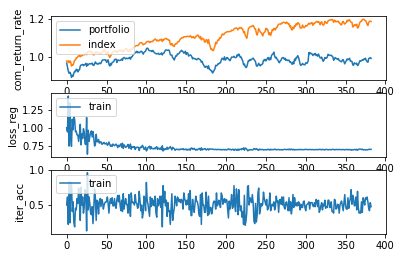

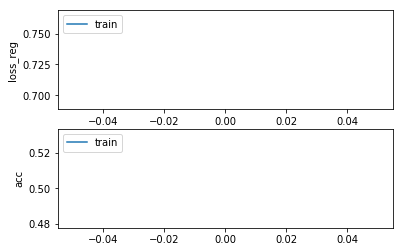

Epochs :  0 Iterations :  383 Loss :  0.7288109999412656 ACC :  0.5056673469843814 MCC :  0.014110394579348672 Precision :  0.5167550063295674
mode : validation


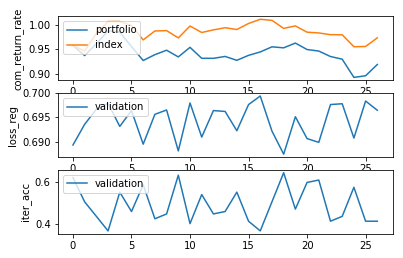

Epochs :  0 Iterations :  27 Loss :  0.6942205870593036 ACC :  0.4923747413688236 MCC :  nan Precision :  0.4826301894392128


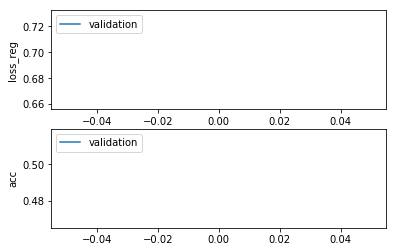

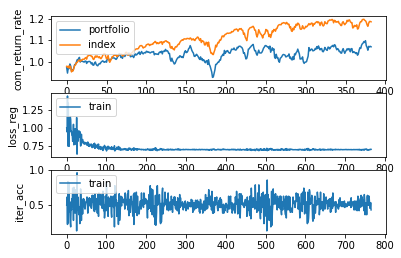

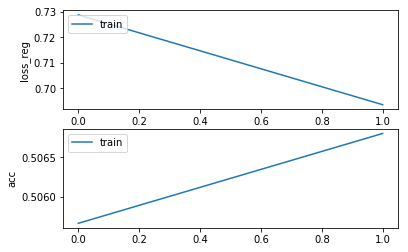

Epochs :  1 Iterations :  766 Loss :  0.6935155413480714 ACC :  0.5068038859776666 MCC :  0.013981051244238008 Precision :  0.5173733541352903
mode : validation


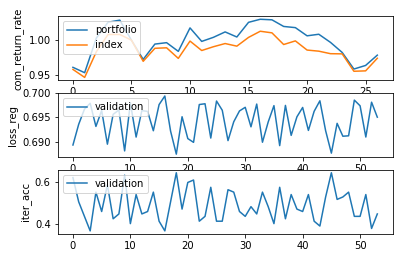

Epochs :  1 Iterations :  27 Loss :  0.6941897604200575 ACC :  0.4888889027966393 MCC :  nan Precision :  0.4814479040602843


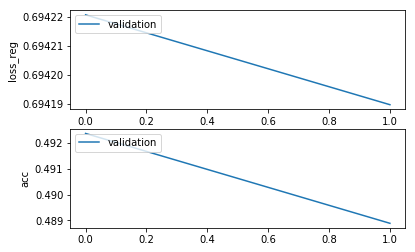

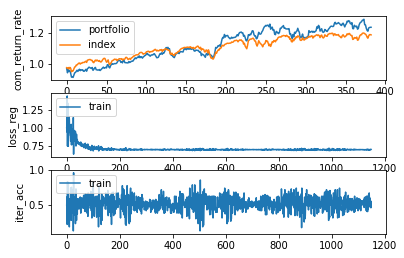

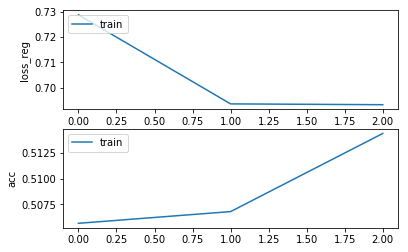

Epochs :  2 Iterations :  1149 Loss :  0.6931915706505041 ACC :  0.514391046124401 MCC :  0.028388387753382597 Precision :  0.5210583286296683
mode : validation


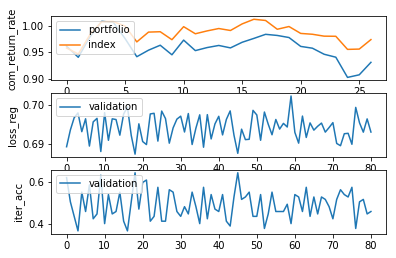

Epochs :  2 Iterations :  27 Loss :  0.6940639592983104 ACC :  0.49368193304097213 MCC :  nan Precision :  0.483840047278338


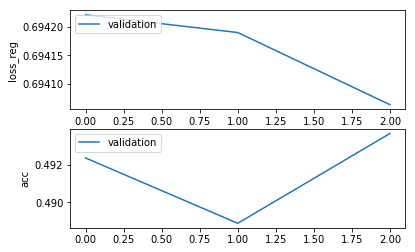

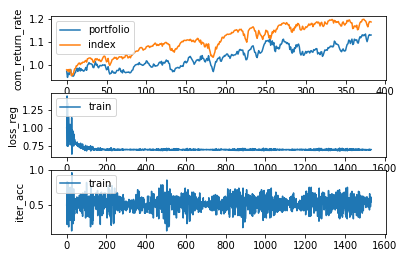

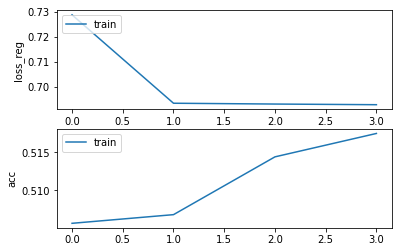

Epochs :  3 Iterations :  1532 Loss :  0.6929288574983183 ACC :  0.5174627712594623 MCC :  0.03525995021727296 Precision :  0.523105195891258
mode : validation


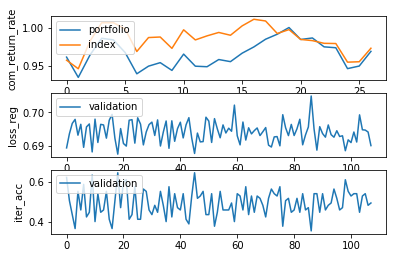

Epochs :  3 Iterations :  27 Loss :  0.6938505812927529 ACC :  0.5028322592929557 MCC :  nan Precision :  0.49469978796939057


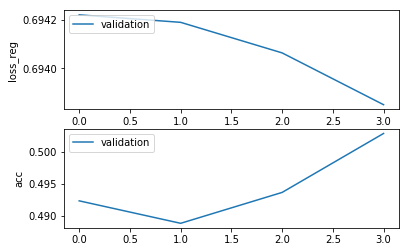

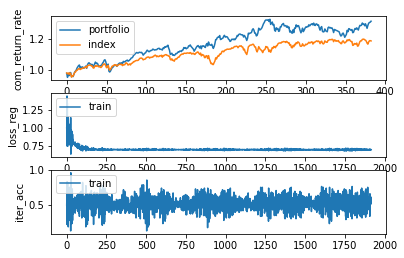

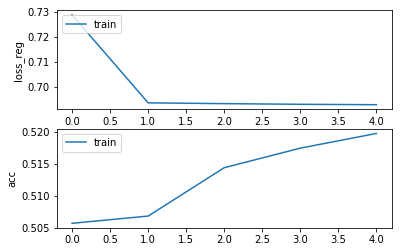

Epochs :  4 Iterations :  1915 Loss :  0.6927658579368193 ACC :  0.5197665647411471 MCC :  0.04131746675038599 Precision :  0.5240898771119102
mode : validation


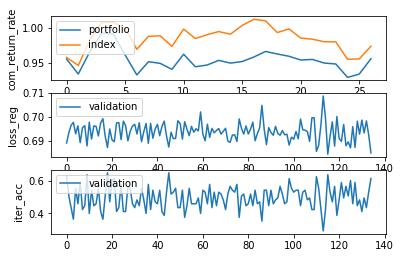

Epochs :  4 Iterations :  27 Loss :  0.6936959359380934 ACC :  0.49803922904862297 MCC :  nan Precision :  0.4912500456665401


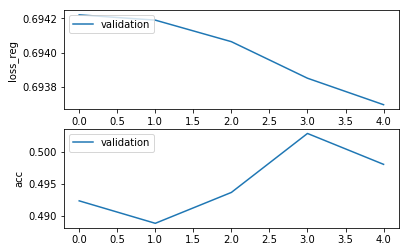

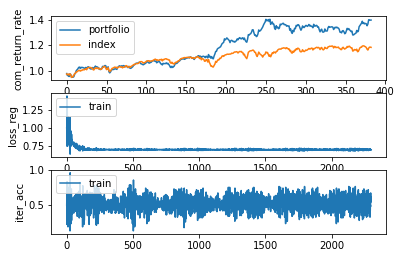

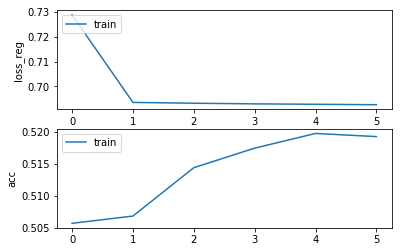

Epochs :  5 Iterations :  2298 Loss :  0.6925924748726987 ACC :  0.5192750884565298 MCC :  0.039963170658072394 Precision :  0.5233965758136997
mode : validation


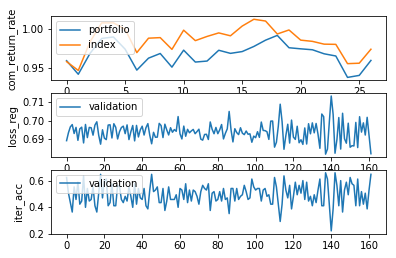

Epochs :  5 Iterations :  27 Loss :  0.6939003688317759 ACC :  0.5015250703802815 MCC :  nan Precision :  0.4941019971889478


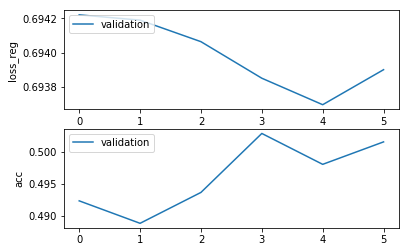

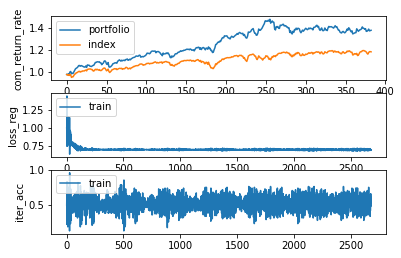

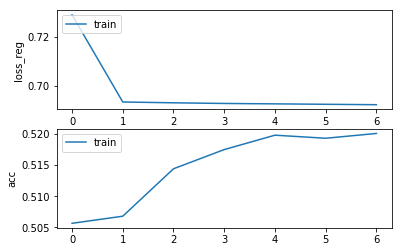

Epochs :  6 Iterations :  2681 Loss :  0.6924232051515704 ACC :  0.5200430203044384 MCC :  0.039615776708687586 Precision :  0.5241231425876872
mode : validation


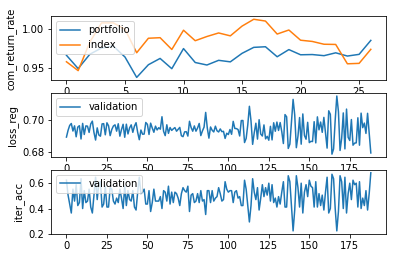

Epochs :  6 Iterations :  27 Loss :  0.6939293057830246 ACC :  0.50413944820563 MCC :  nan Precision :  0.49525529946442004


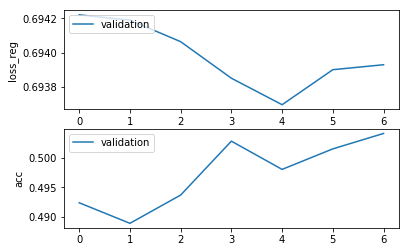

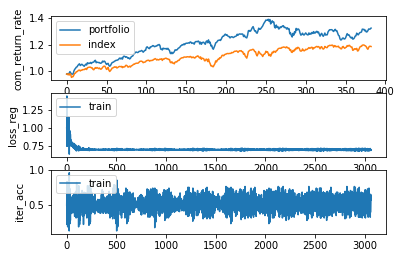

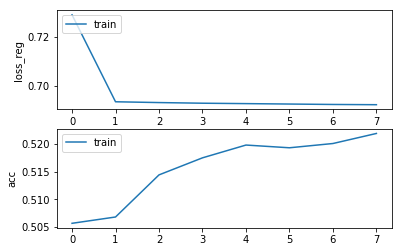

Epochs :  7 Iterations :  3064 Loss :  0.692324308440206 ACC :  0.5218553380461959 MCC :  0.0416597469825925 Precision :  0.524637650435805
mode : validation


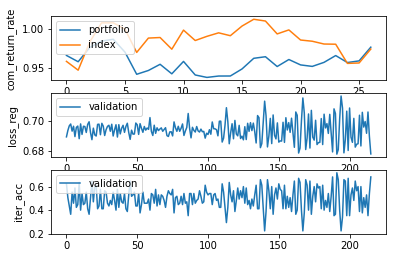

Epochs :  7 Iterations :  27 Loss :  0.6941005653805203 ACC :  0.5019608002018046 MCC :  nan Precision :  0.493740429756818


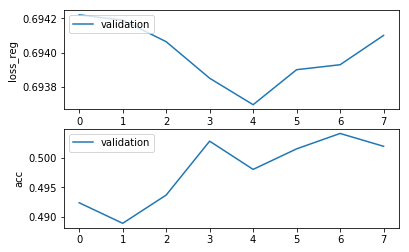

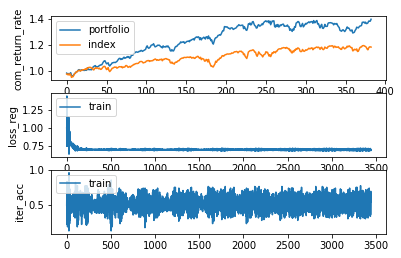

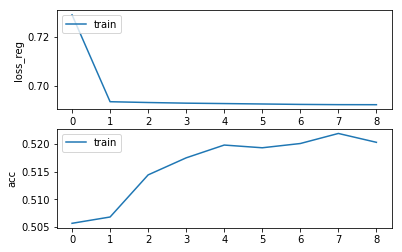

Epochs :  8 Iterations :  3447 Loss :  0.6923021068772199 ACC :  0.5202580409479515 MCC :  0.04059720481016403 Precision :  0.5240260836651291
mode : validation


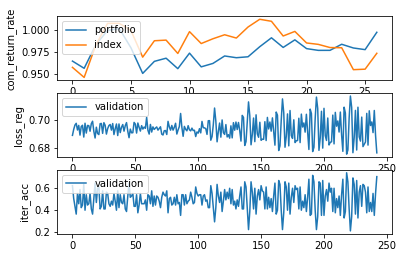

Epochs :  8 Iterations :  27 Loss :  0.6939317694416752 ACC :  0.504575178027153 MCC :  nan Precision :  0.49537681815800844


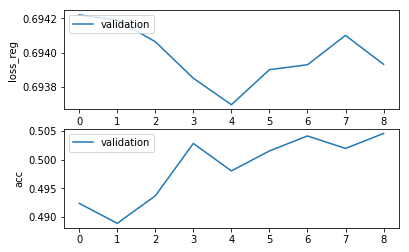

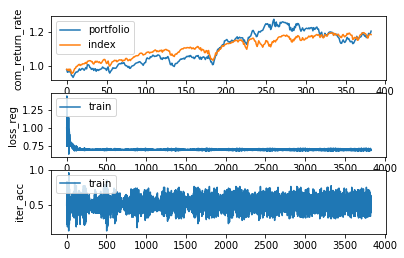

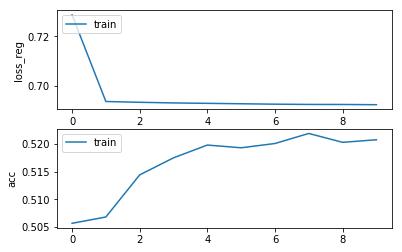

Epochs :  9 Iterations :  3830 Loss :  0.6922100194129247 ACC :  0.5207187994808814 MCC :  0.04183836880245784 Precision :  0.524325755616898
mode : validation


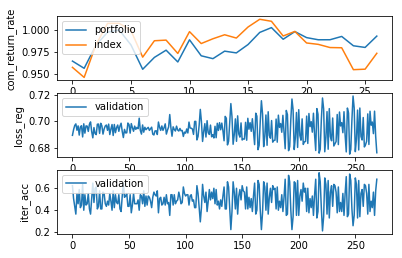

Epochs :  9 Iterations :  27 Loss :  0.6940195074787846 ACC :  0.505882368043617 MCC :  nan Precision :  0.4960613961297053


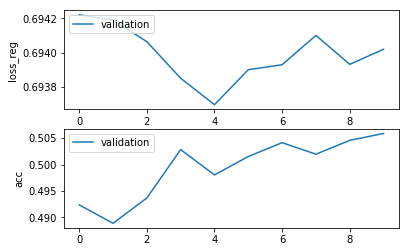

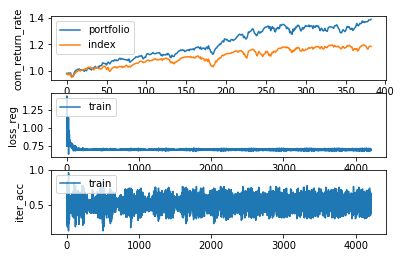

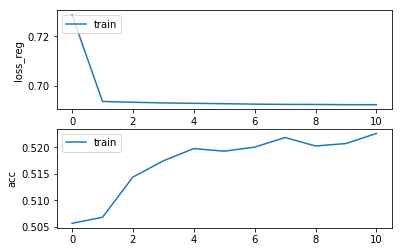

Epochs :  10 Iterations :  4213 Loss :  0.6921964989629801 ACC :  0.5226232692716016 MCC :  0.04503476608747631 Precision :  0.525586799156728
mode : validation


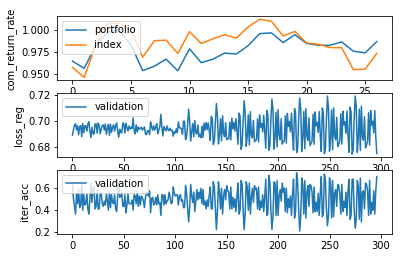

Epochs :  10 Iterations :  27 Loss :  0.6940794631286904 ACC :  0.49934642016887665 MCC :  nan Precision :  0.49421385937818774


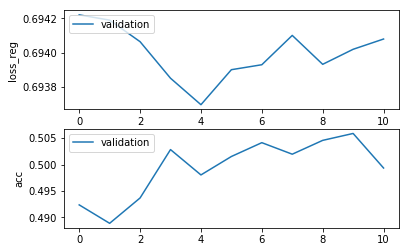

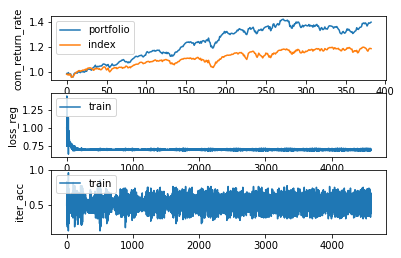

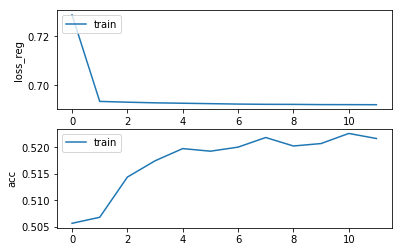

Epochs :  11 Iterations :  4596 Loss :  0.6921675304831164 ACC :  0.5216710350376508 MCC :  0.04199708602755931 Precision :  0.52439709496502
mode : validation


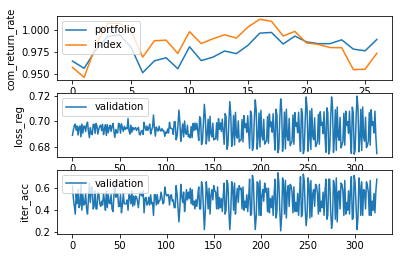

Epochs :  11 Iterations :  27 Loss :  0.694159468015035 ACC :  0.5019607990980148 MCC :  nan Precision :  0.49529343595107395


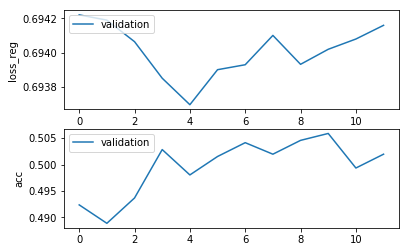

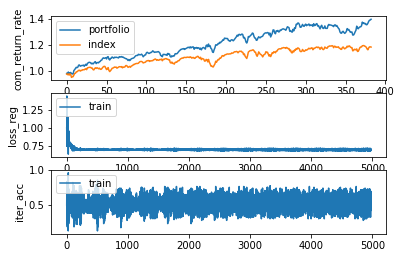

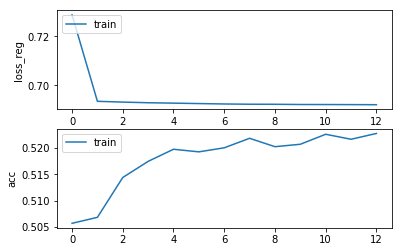

Epochs :  12 Iterations :  4979 Loss :  0.6921280385931229 ACC :  0.5227768551898687 MCC :  0.045496374476724125 Precision :  0.5254138673536538
mode : validation


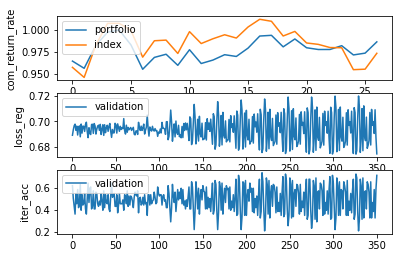

Epochs :  12 Iterations :  27 Loss :  0.6942608643461157 ACC :  0.49934642016887665 MCC :  nan Precision :  0.4928255373681033


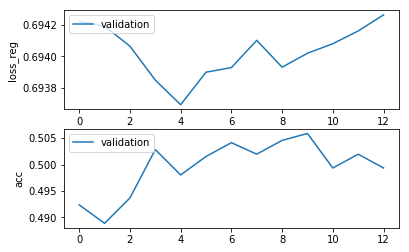

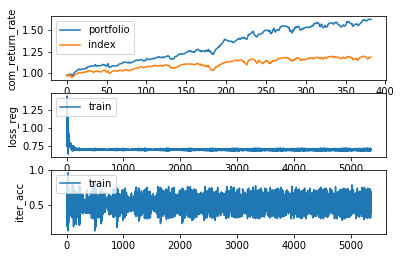

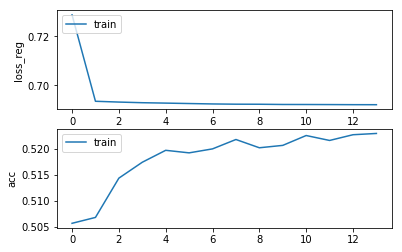

Epochs :  13 Iterations :  5362 Loss :  0.6921153829552175 ACC :  0.523022593390537 MCC :  0.04520135243209298 Precision :  0.5251967296023748
mode : validation


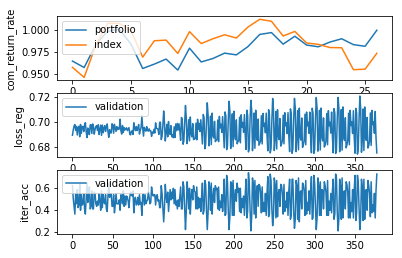

Epochs :  13 Iterations :  27 Loss :  0.694202478285189 ACC :  0.49803923070430756 MCC :  nan Precision :  0.491703191427169


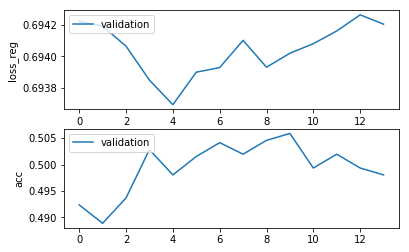

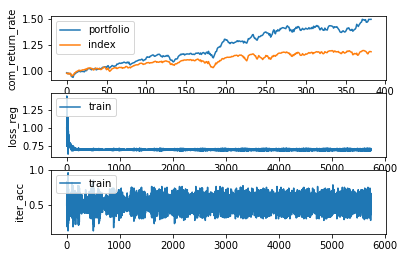

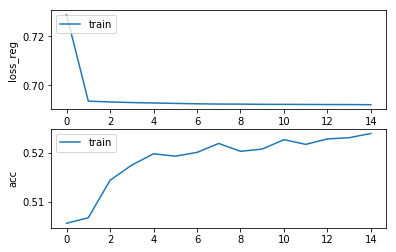

Epochs :  14 Iterations :  5745 Loss :  0.6920588687256796 ACC :  0.5238826764314667 MCC :  0.047605473526744976 Precision :  0.5259547115597806
mode : validation


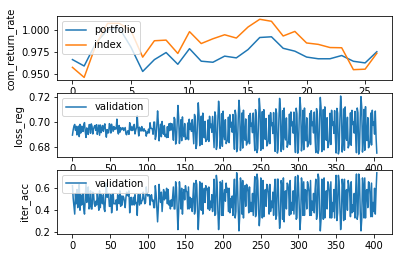

Epochs :  14 Iterations :  27 Loss :  0.6942051737396805 ACC :  0.5028322587410609 MCC :  nan Precision :  0.4941701029461843


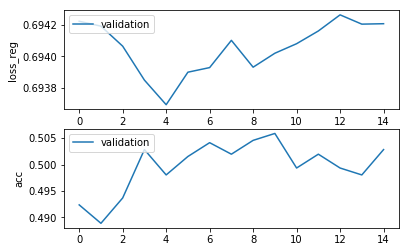

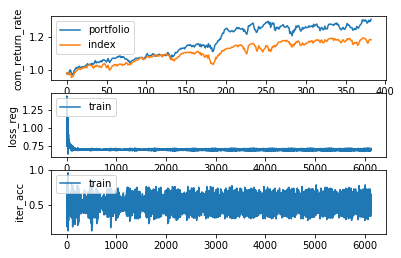

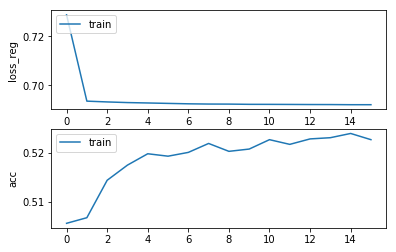

Epochs :  15 Iterations :  6128 Loss :  0.6920579178526258 ACC :  0.5226232696606659 MCC :  0.04486236359873013 Precision :  0.5253452169356319
mode : validation


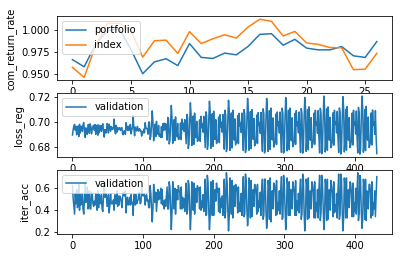

Epochs :  15 Iterations :  27 Loss :  0.6941928289554737 ACC :  0.49629631141821545 MCC :  nan Precision :  0.49292562805392126


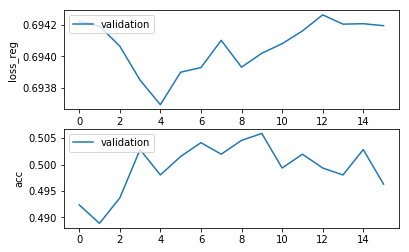

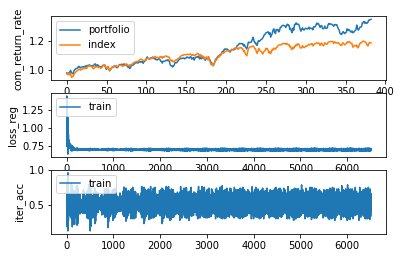

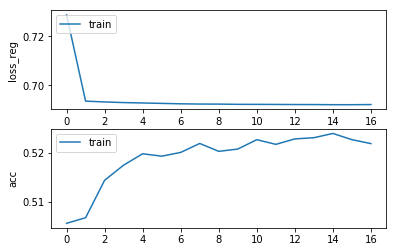

Epochs :  16 Iterations :  6511 Loss :  0.6921203939472726 ACC :  0.5218246211115436 MCC :  0.04312750909586289 Precision :  0.5248604194983334
mode : validation


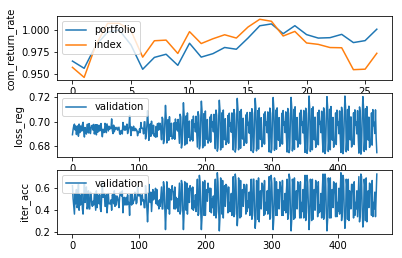

Epochs :  16 Iterations :  27 Loss :  0.6941618764841998 ACC :  0.49934642016887665 MCC :  nan Precision :  0.49427961337345616


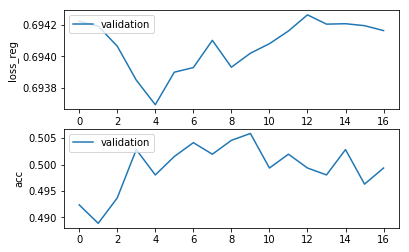

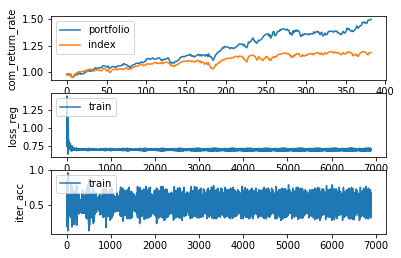

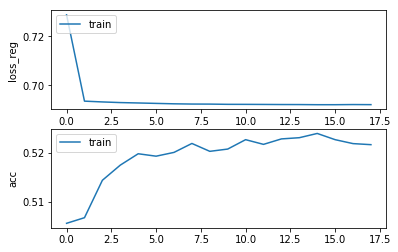

Epochs :  17 Iterations :  6894 Loss :  0.6920844146850527 ACC :  0.5216095999233406 MCC :  0.04425898241228728 Precision :  0.5248867316565454
mode : validation


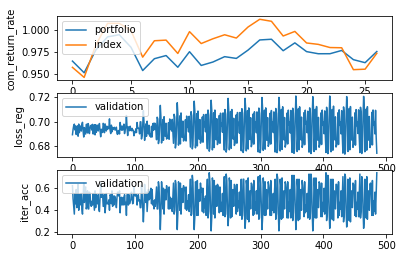

Epochs :  17 Iterations :  27 Loss :  0.6941644924658316 ACC :  0.5006536096334457 MCC :  nan Precision :  0.49314341473358647


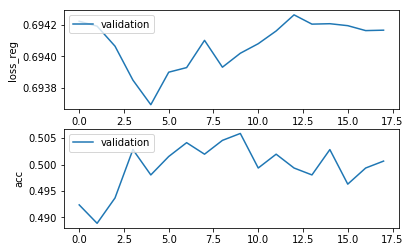

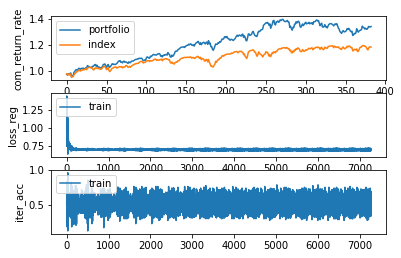

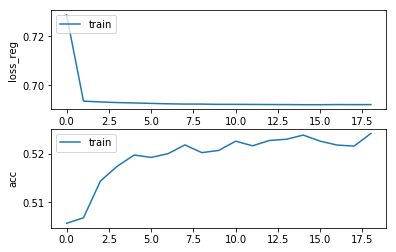

Epochs :  18 Iterations :  7277 Loss :  0.6920982196187848 ACC :  0.5242205659807818 MCC :  0.047063657509372143 Precision :  0.5257530643825976
mode : validation


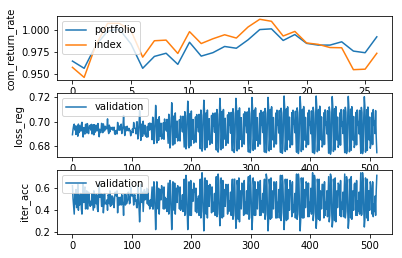

Epochs :  18 Iterations :  27 Loss :  0.6941707465383742 ACC :  0.49847496052583057 MCC :  nan Precision :  0.4910646966762013


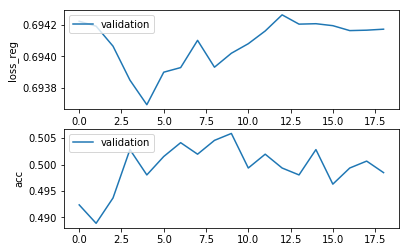

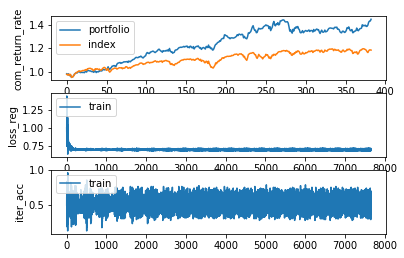

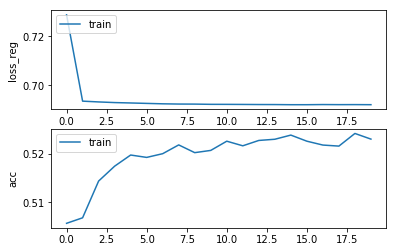

Epochs :  19 Iterations :  7660 Loss :  0.6920645563782973 ACC :  0.523053310480815 MCC :  0.04533854656589555 Precision :  0.525208668428286
mode : validation


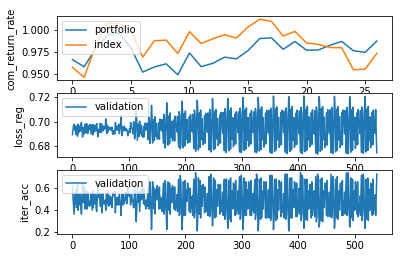

Epochs :  19 Iterations :  27 Loss :  0.6941956303737782 ACC :  0.5010893394549688 MCC :  nan Precision :  0.49267878935292914


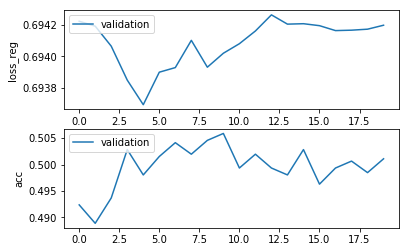

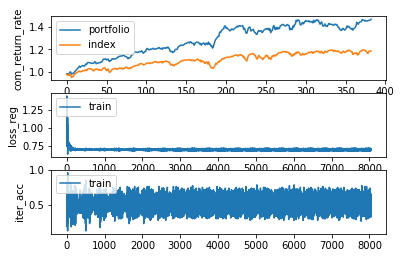

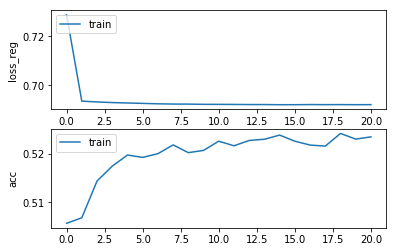

Epochs :  20 Iterations :  8043 Loss :  0.6920860971545426 ACC :  0.5235140690915578 MCC :  0.04691029971665472 Precision :  0.5259888900867019
mode : validation


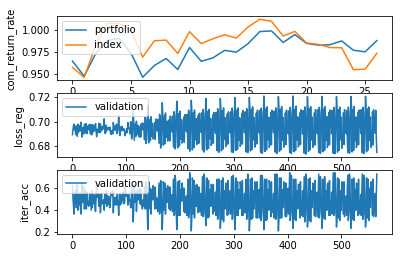

Epochs :  20 Iterations :  27 Loss :  0.6942124477139225 ACC :  0.5002178798119227 MCC :  nan Precision :  0.4933585247231854


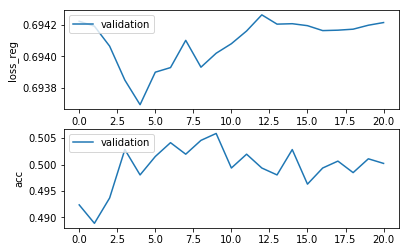

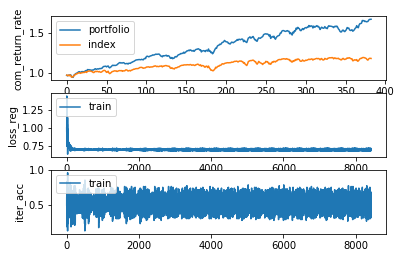

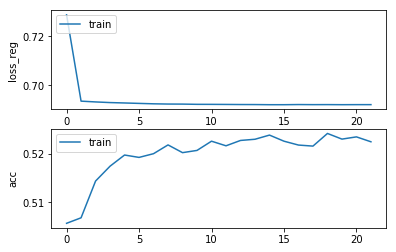

Epochs :  21 Iterations :  8426 Loss :  0.692086398601532 ACC :  0.5225004002879867 MCC :  0.0443802846379228 Precision :  0.5250810438441235
mode : validation


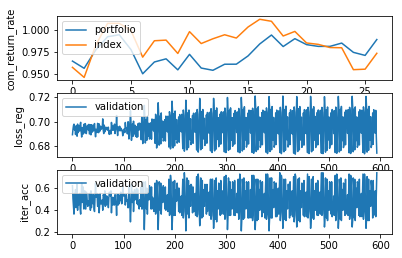

Epochs :  21 Iterations :  27 Loss :  0.6942557758755155 ACC :  0.5006536096334457 MCC :  nan Precision :  0.4932691748771403


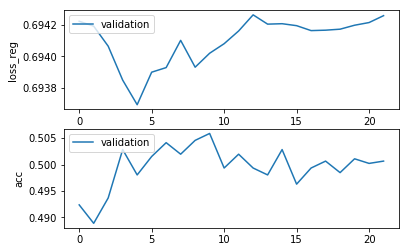

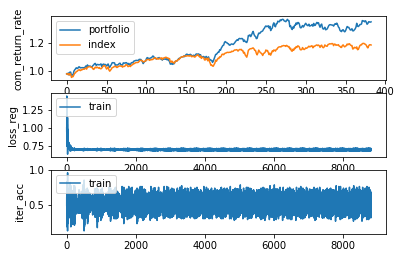

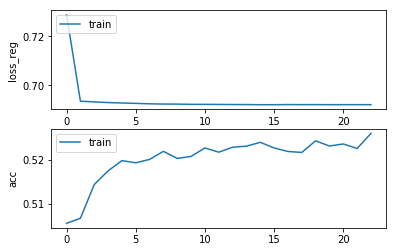

Epochs :  22 Iterations :  8809 Loss :  0.6920660313987234 ACC :  0.5258792980377107 MCC :  0.05042367249024502 Precision :  0.5270812556915977
mode : validation


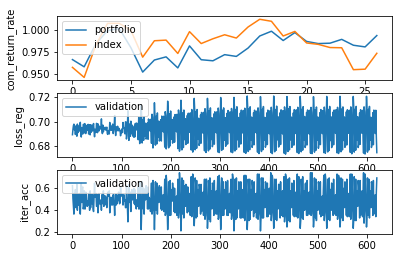

Epochs :  22 Iterations :  27 Loss :  0.6941731020256325 ACC :  0.5010893394549688 MCC :  nan Precision :  0.493655145858173


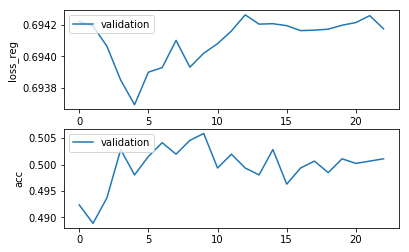

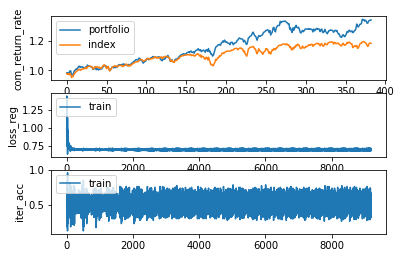

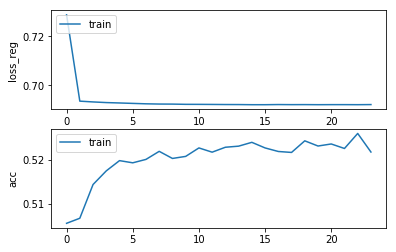

Epochs :  23 Iterations :  9192 Loss :  0.6921117089435886 ACC :  0.521701751505426 MCC :  0.04182470972086218 Precision :  0.5244010422067527
mode : validation


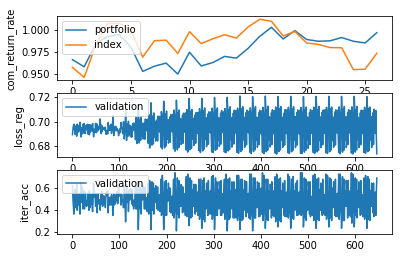

Epochs :  23 Iterations :  27 Loss :  0.6942072621098271 ACC :  0.4958605815966924 MCC :  nan Precision :  0.490838423371315


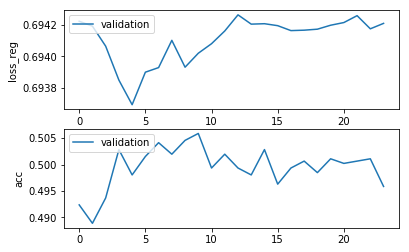

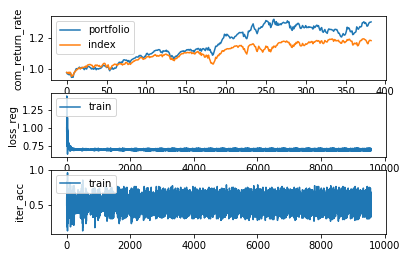

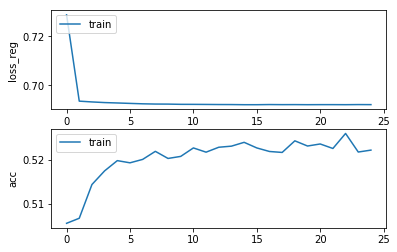

Epochs :  24 Iterations :  9575 Loss :  0.6920898944217293 ACC :  0.5221317934149551 MCC :  0.042126061501347414 Precision :  0.5246394735568887
mode : validation


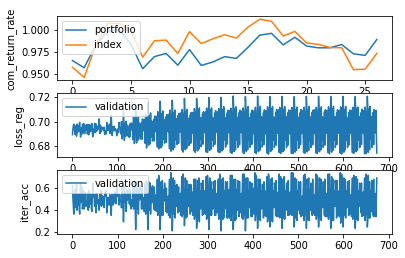

Epochs :  24 Iterations :  27 Loss :  0.6942922649560151 ACC :  0.49673204123973846 MCC :  nan Precision :  0.4928711389225942


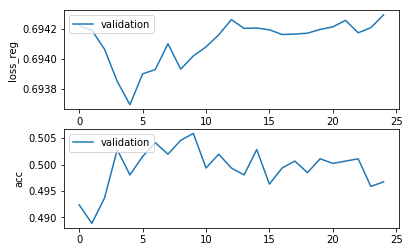

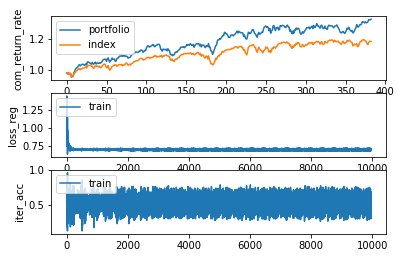

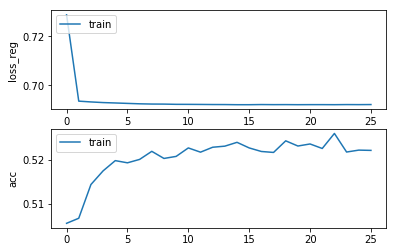

Epochs :  25 Iterations :  9958 Loss :  0.6921196365169694 ACC :  0.5220703586897091 MCC :  0.043448772833697184 Precision :  0.5249660959462429
mode : validation


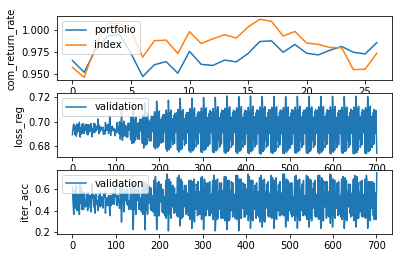

Epochs :  25 Iterations :  27 Loss :  0.6942692156191226 ACC :  0.5010893394549688 MCC :  nan Precision :  0.49254914635309466


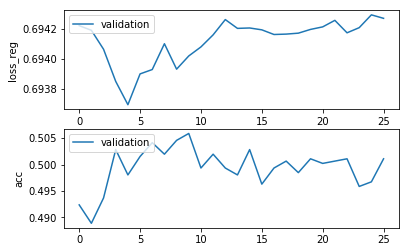

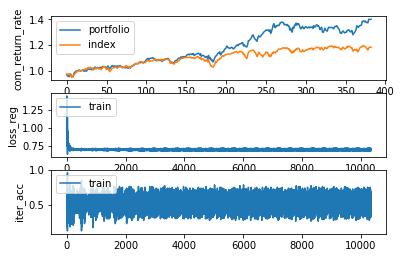

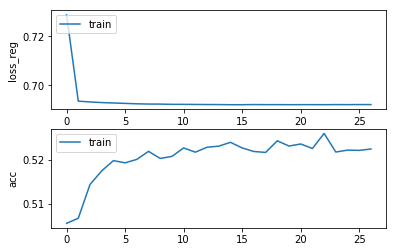

Epochs :  26 Iterations :  10341 Loss :  0.6921075890643167 ACC :  0.5223775306818691 MCC :  0.044112351198690426 Precision :  0.5251339820721831
mode : validation


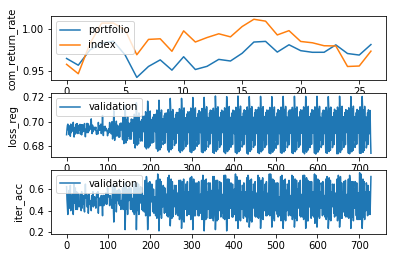

Epochs :  26 Iterations :  27 Loss :  0.6941304250999734 ACC :  0.5002178798119227 MCC :  nan Precision :  0.4917664885244988


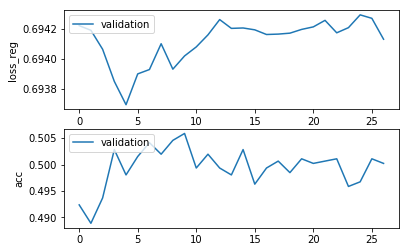

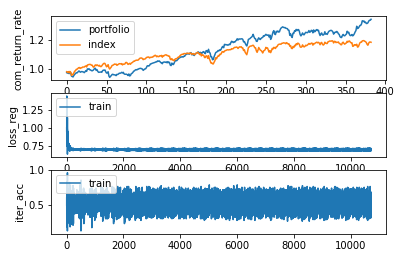

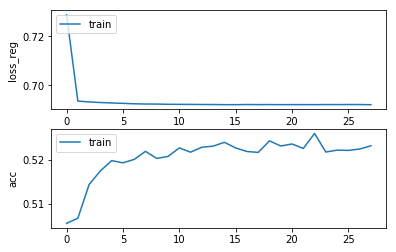

Epochs :  27 Iterations :  10724 Loss :  0.692044067943065 ACC :  0.5231147448948096 MCC :  0.04814666216416703 Precision :  0.526126698340355
mode : validation


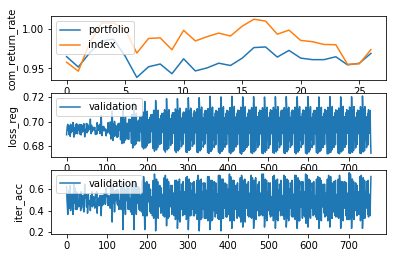

Epochs :  27 Iterations :  27 Loss :  0.6942219425130773 ACC :  0.503703718384107 MCC :  nan Precision :  0.4947105806182932


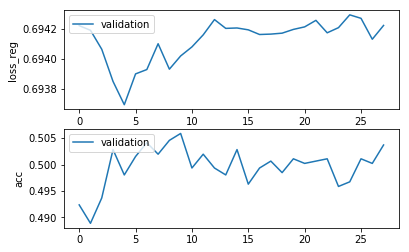

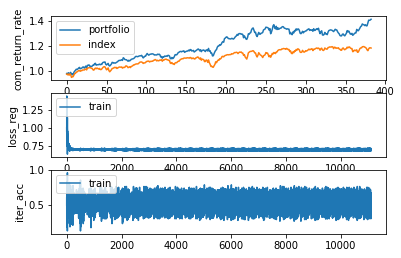

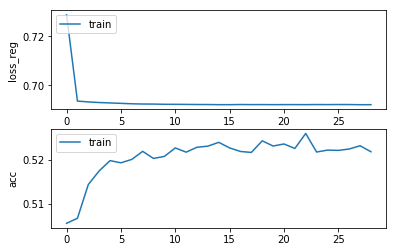

Epochs :  28 Iterations :  11107 Loss :  0.6920562022348609 ACC :  0.5217631858416076 MCC :  0.043825031786746106 Precision :  0.5250726668577514
mode : validation


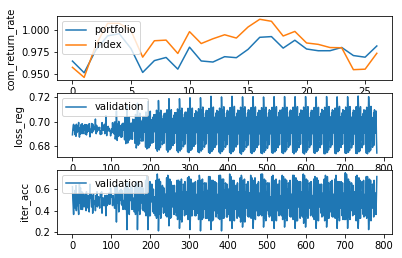

Epochs :  28 Iterations :  27 Loss :  0.6942559083302816 ACC :  0.5006536096334457 MCC :  nan Precision :  0.49370427967773545


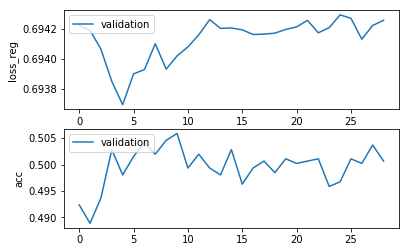

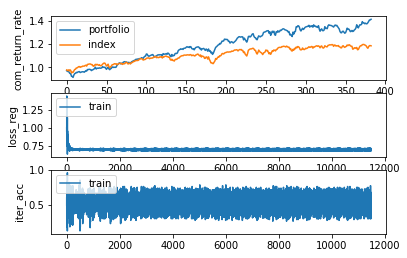

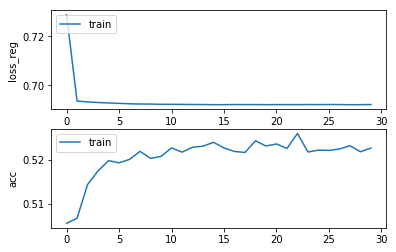

Epochs :  29 Iterations :  11490 Loss :  0.692118016920264 ACC :  0.5225925516366337 MCC :  0.04543501516550599 Precision :  0.5254400093351581
mode : validation


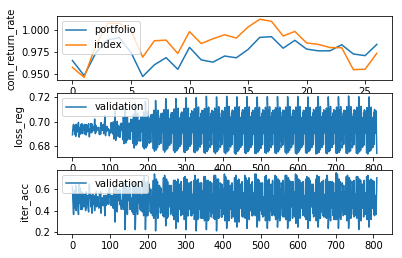

Epochs :  29 Iterations :  27 Loss :  0.6941937031569304 ACC :  0.5028322587410609 MCC :  nan Precision :  0.4943153780919534


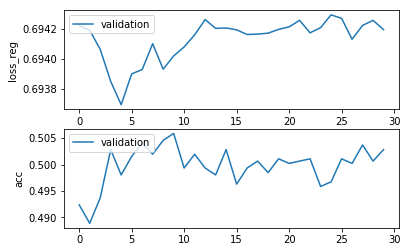

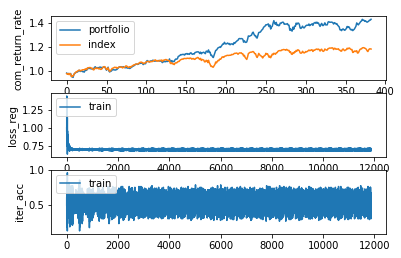

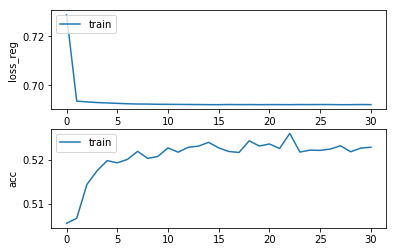

Epochs :  30 Iterations :  11873 Loss :  0.6920769795114005 ACC :  0.5227768558123715 MCC :  0.04474103918305766 Precision :  0.5253045819505232
mode : validation


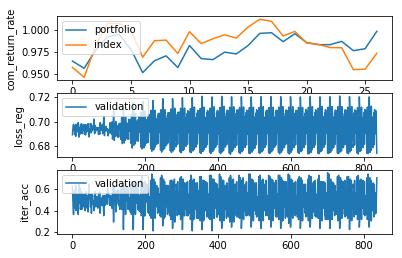

Epochs :  30 Iterations :  27 Loss :  0.6941961844762167 ACC :  0.5002178798119227 MCC :  nan Precision :  0.4926342655111242


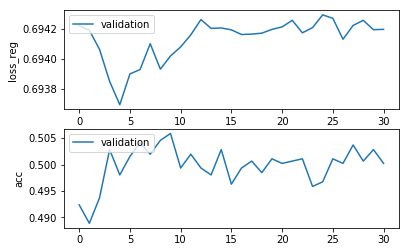

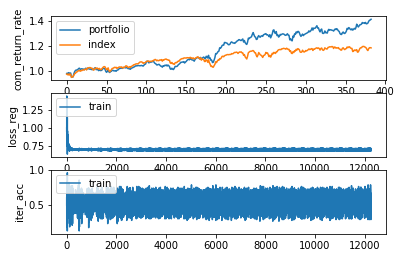

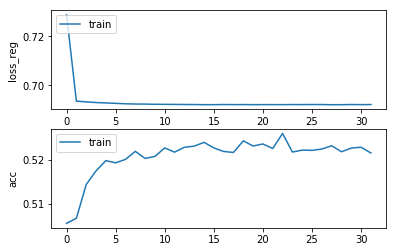

Epochs :  31 Iterations :  12256 Loss :  0.692112772645278 ACC :  0.5214867308619128 MCC :  0.04250727997036218 Precision :  0.5245329997509562
mode : validation


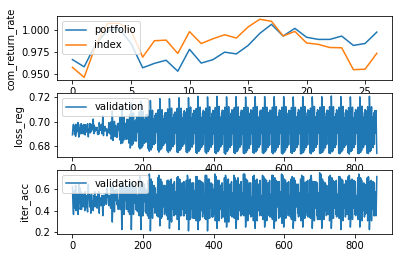

Epochs :  31 Iterations :  27 Loss :  0.6941879502049199 ACC :  0.5015250692764918 MCC :  nan Precision :  0.4940614723772914


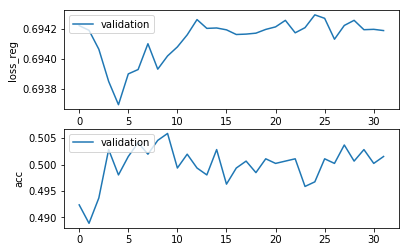

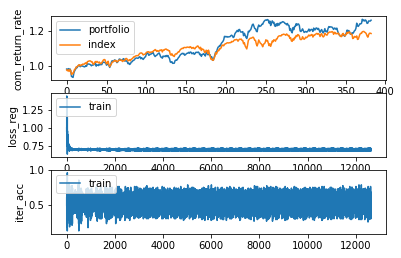

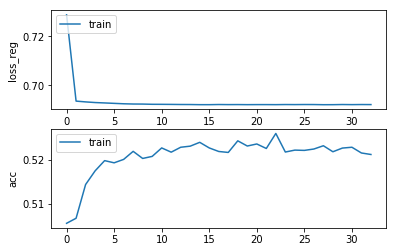

Epochs :  32 Iterations :  12639 Loss :  0.6920936160548238 ACC :  0.5211488412736912 MCC :  0.0424186926163057 Precision :  0.524543052018856
mode : validation


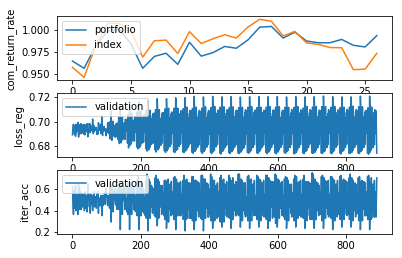

Epochs :  32 Iterations :  27 Loss :  0.6941299990371421 ACC :  0.49934642016887665 MCC :  nan Precision :  0.4931012890129178


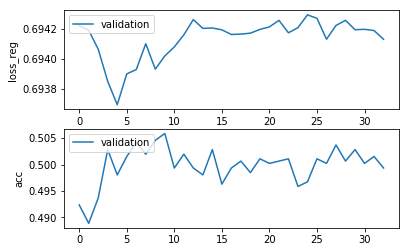

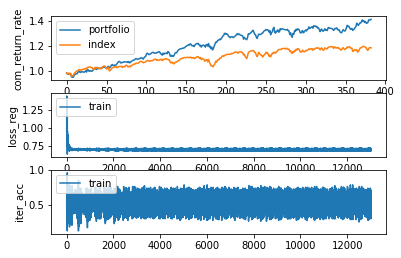

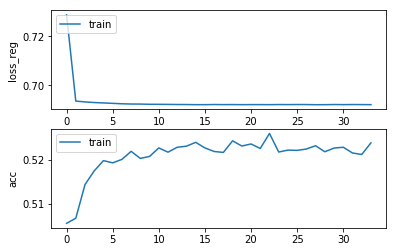

Epochs :  33 Iterations :  13022 Loss :  0.692063704794443 ACC :  0.523759807292226 MCC :  0.04604774275499787 Precision :  0.5255215992523703
mode : validation


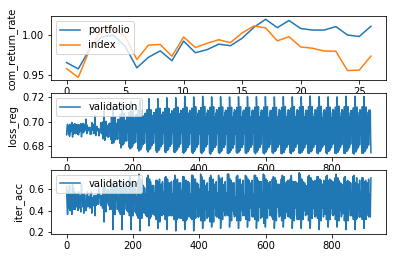

Epochs :  33 Iterations :  27 Loss :  0.6942890220218234 ACC :  0.4941176623106003 MCC :  nan Precision :  0.49064691751091566


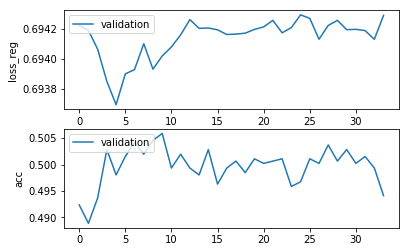

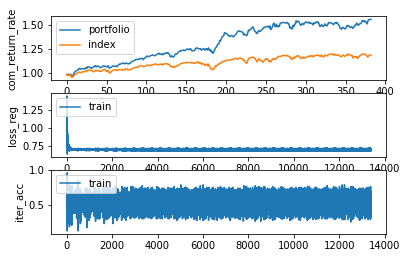

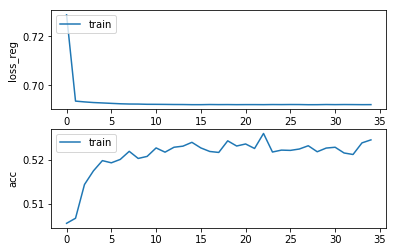

Epochs :  34 Iterations :  13405 Loss :  0.6920765610338814 ACC :  0.5244355867021078 MCC :  0.04793615717676106 Precision :  0.5262058963537138
mode : validation


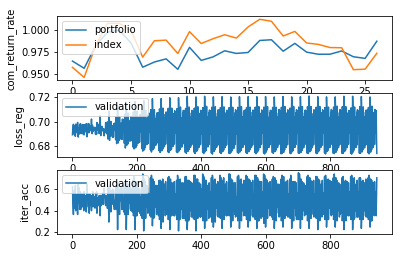

Epochs :  34 Iterations :  27 Loss :  0.6942674782541063 ACC :  0.49934642016887665 MCC :  nan Precision :  0.49230601804123986


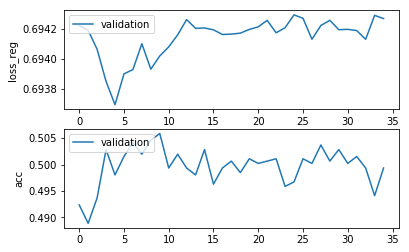

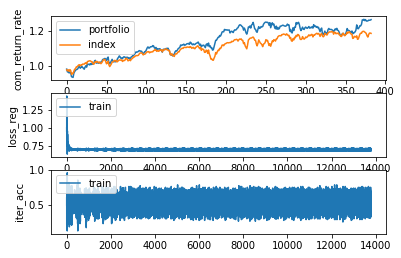

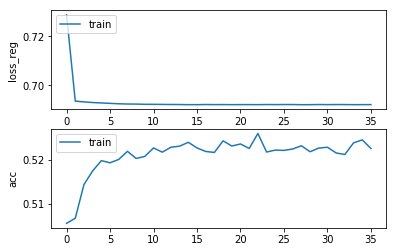

Epochs :  35 Iterations :  13788 Loss :  0.6920837078331034 ACC :  0.5225004004436125 MCC :  0.044647058582677465 Precision :  0.5250915981070491
mode : validation


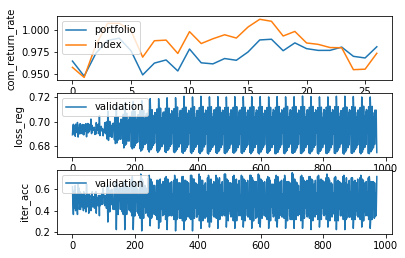

Epochs :  35 Iterations :  27 Loss :  0.6942599172945376 ACC :  0.4954248517751694 MCC :  nan Precision :  0.4911019709651117


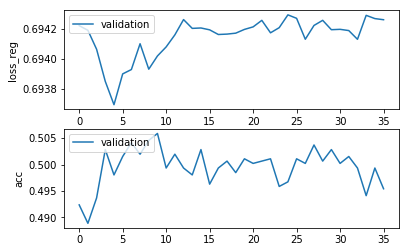

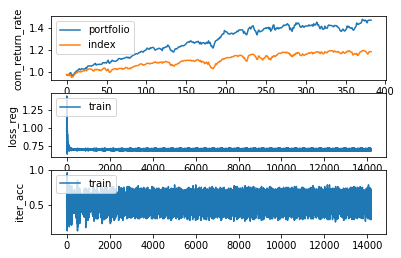

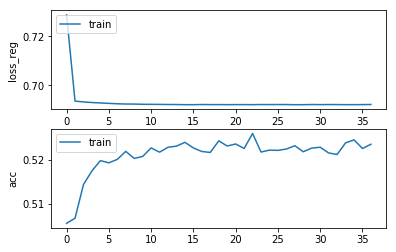

Epochs :  36 Iterations :  14171 Loss :  0.6921336165296191 ACC :  0.5234526349888147 MCC :  0.04537513562828891 Precision :  0.5255139533906942
mode : validation


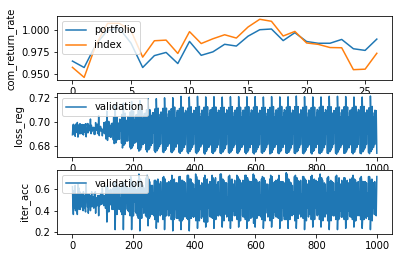

Epochs :  36 Iterations :  27 Loss :  0.6943200561735365 ACC :  0.5006536096334457 MCC :  nan Precision :  0.492779149501412


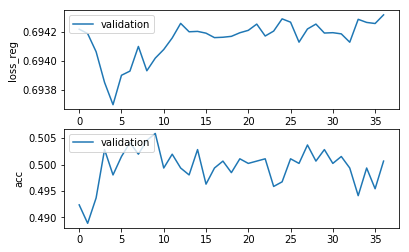

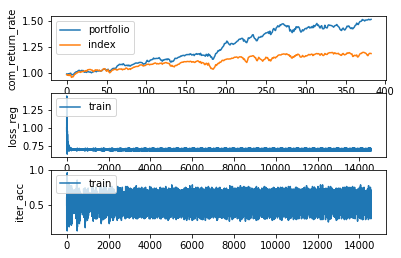

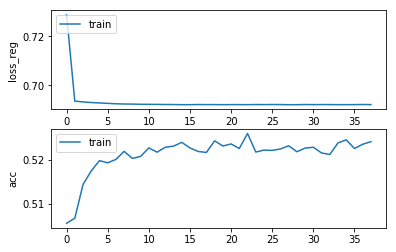

Epochs :  37 Iterations :  14554 Loss :  0.6920867556068978 ACC :  0.5240362627387981 MCC :  0.04621705605861835 Precision :  0.5257519792531941
mode : validation


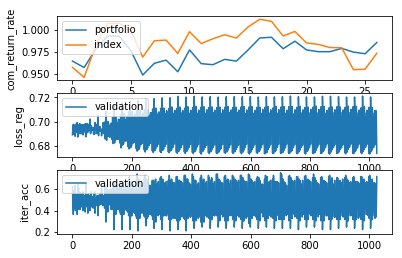

Epochs :  37 Iterations :  27 Loss :  0.6941449200665509 ACC :  0.49934642016887665 MCC :  nan Precision :  0.4921947452757094


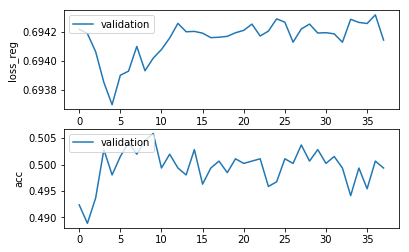

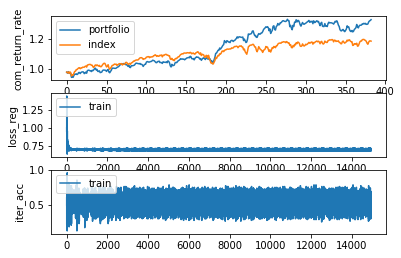

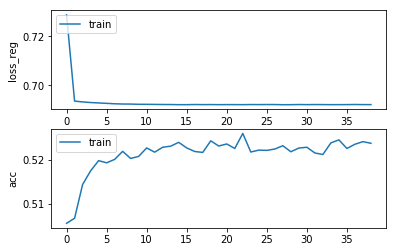

Epochs :  38 Iterations :  14937 Loss :  0.6920820469955863 ACC :  0.5236676557879535 MCC :  0.046409277696321735 Precision :  0.5256606640085072
mode : validation


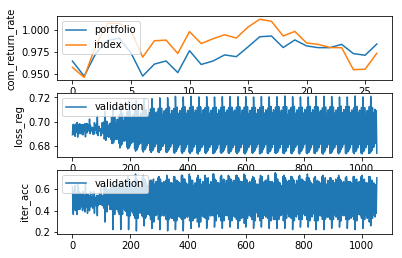

Epochs :  38 Iterations :  27 Loss :  0.6943132877349854 ACC :  0.4993464207207715 MCC :  nan Precision :  0.4919857809113132


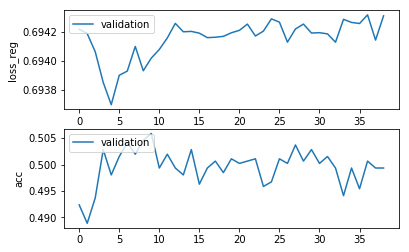

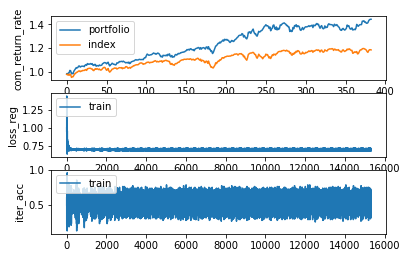

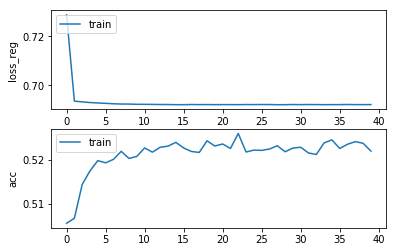

Epochs :  39 Iterations :  15320 Loss :  0.692089967721436 ACC :  0.5219167720711262 MCC :  0.04252670059122228 Precision :  0.5245026575386835
mode : validation


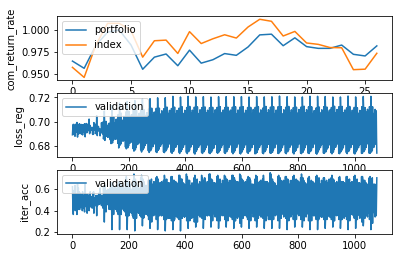

Epochs :  39 Iterations :  27 Loss :  0.6942444973521762 ACC :  0.49498912195364636 MCC :  nan Precision :  0.4907691776752472


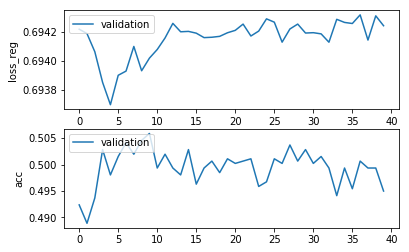

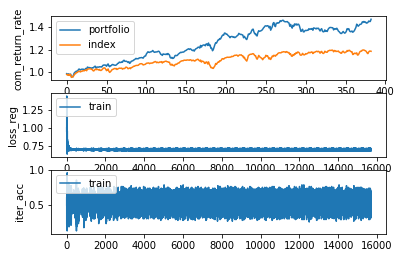

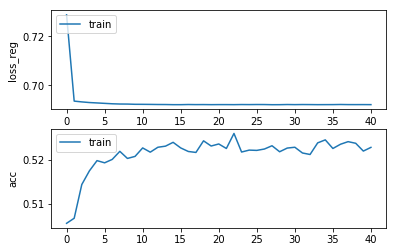

Epochs :  40 Iterations :  15703 Loss :  0.692072165541487 ACC :  0.5227461381774036 MCC :  0.04556773917390248 Precision :  0.5256324085521247
mode : validation


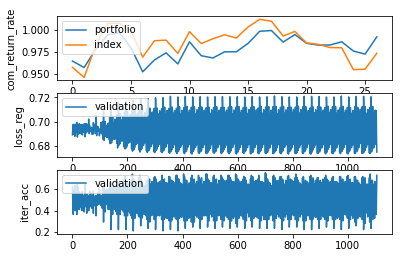

Epochs :  40 Iterations :  27 Loss :  0.6942524402229874 ACC :  0.5002178798119227 MCC :  nan Precision :  0.4934390454932495


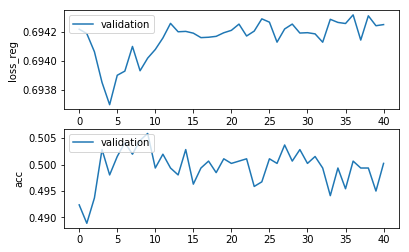

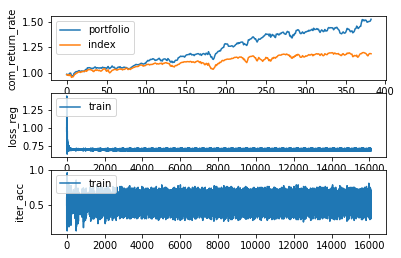

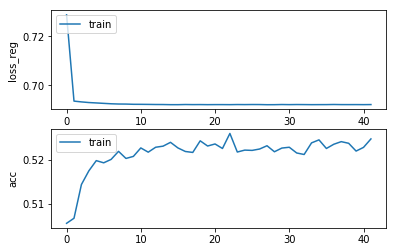

Epochs :  41 Iterations :  16086 Loss :  0.6921004246793901 ACC :  0.5246506077346852 MCC :  0.04854884386541657 Precision :  0.5265747854539604
mode : validation


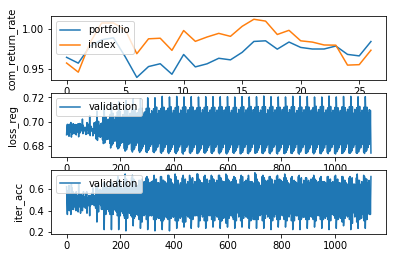

Epochs :  41 Iterations :  27 Loss :  0.6942330709210148 ACC :  0.5058823674917221 MCC :  nan Precision :  0.4943802133202553


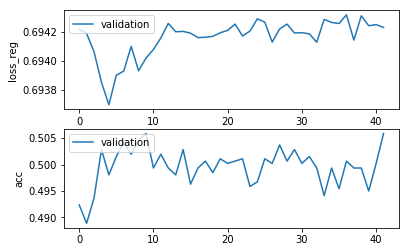

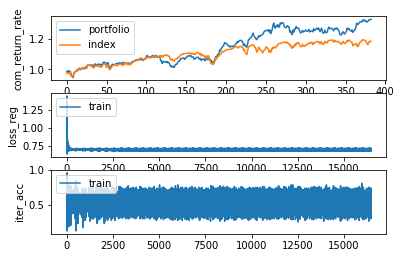

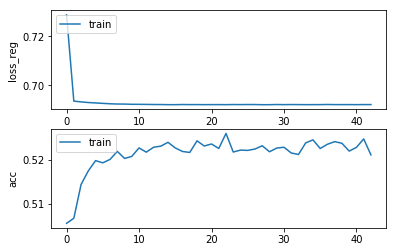

Epochs :  42 Iterations :  16469 Loss :  0.6921007700128281 ACC :  0.5210566895748866 MCC :  0.042199582233842625 Precision :  0.52454778985862
mode : validation


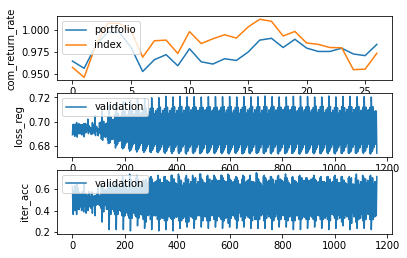

Epochs :  42 Iterations :  27 Loss :  0.6941566864649454 ACC :  0.5023965289195379 MCC :  nan Precision :  0.4929020080577444


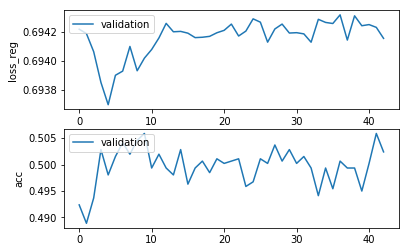

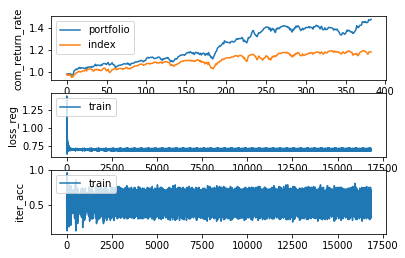

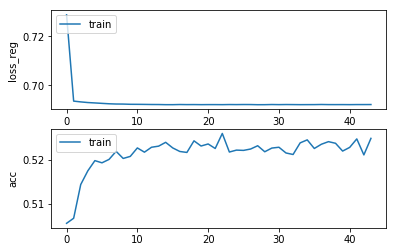

Epochs :  43 Iterations :  16852 Loss :  0.6921111658098803 ACC :  0.5247734767183 MCC :  0.04825302047971709 Precision :  0.5264398794981113
mode : validation


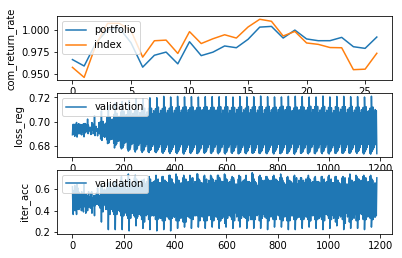

Epochs :  43 Iterations :  27 Loss :  0.6941993457299692 ACC :  0.49803923070430756 MCC :  nan Precision :  0.4926606373930419


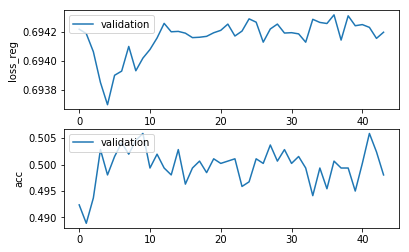

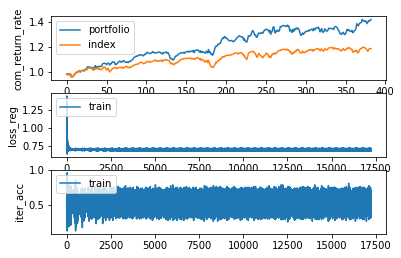

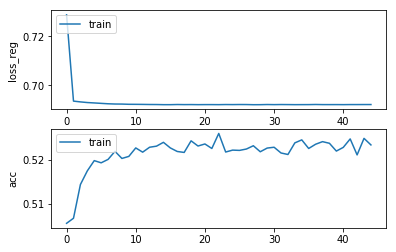

Epochs :  44 Iterations :  17235 Loss :  0.6921103498643123 ACC :  0.5232990486036704 MCC :  0.04541768856539923 Precision :  0.5254510383148417
mode : validation


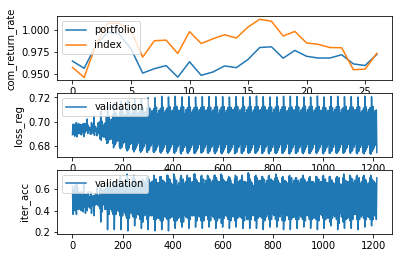

Epochs :  44 Iterations :  27 Loss :  0.694109249998022 ACC :  0.5028322592929557 MCC :  nan Precision :  0.49435583405472616


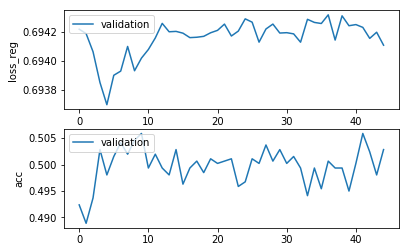

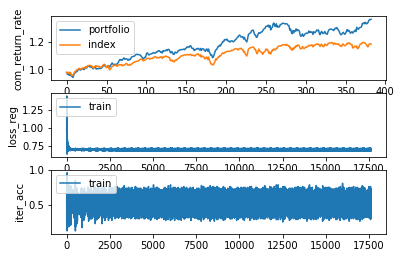

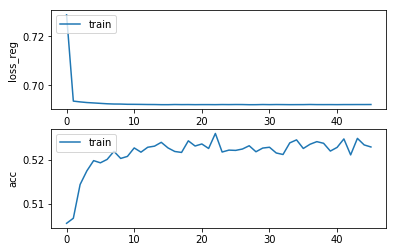

Epochs :  45 Iterations :  17618 Loss :  0.6921224570772355 ACC :  0.5228382899151147 MCC :  0.04439721304033312 Precision :  0.5251365268442478
mode : validation


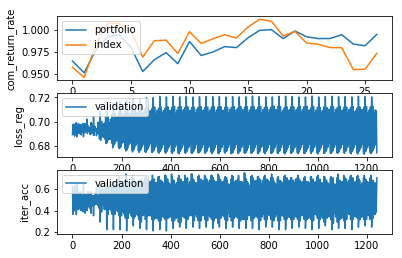

Epochs :  45 Iterations :  27 Loss :  0.6941151022911072 ACC :  0.5023965289195379 MCC :  nan Precision :  0.4925426719365297


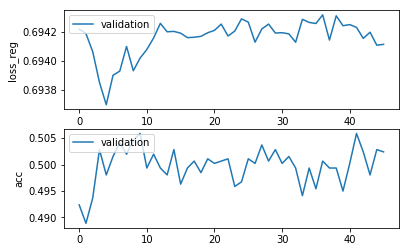

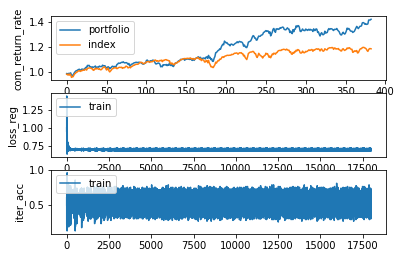

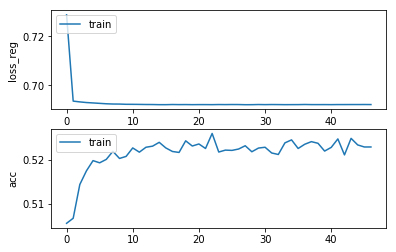

Epochs :  46 Iterations :  18001 Loss :  0.6921020439648441 ACC :  0.5228382899151147 MCC :  0.04426268157251325 Precision :  0.5248554651588979
mode : validation


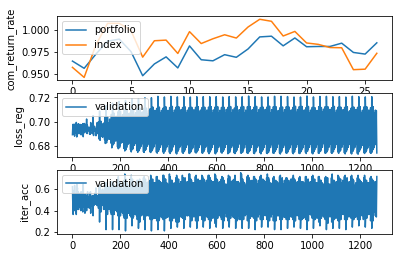

Epochs :  46 Iterations :  27 Loss :  0.6942026284005907 ACC :  0.49760350088278454 MCC :  nan Precision :  0.4929036155894951


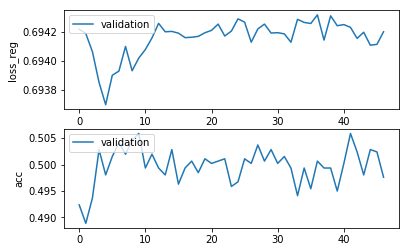

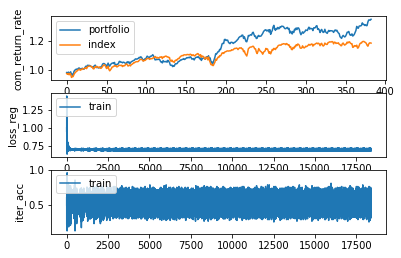

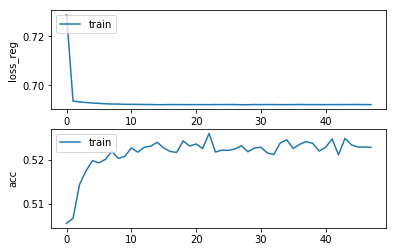

Epochs :  47 Iterations :  18384 Loss :  0.6920776678438909 ACC :  0.52274613821631 MCC :  0.043818986529512355 Precision :  0.5251339553434684
mode : validation


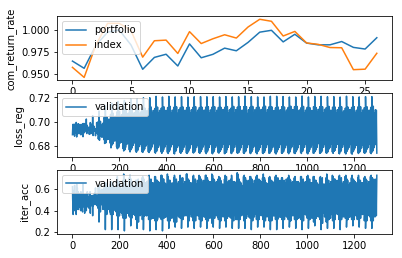

Epochs :  47 Iterations :  27 Loss :  0.694134533405304 ACC :  0.505446637670199 MCC :  nan Precision :  0.49594532960542925


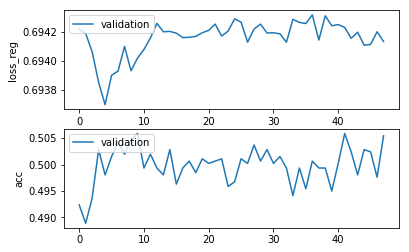

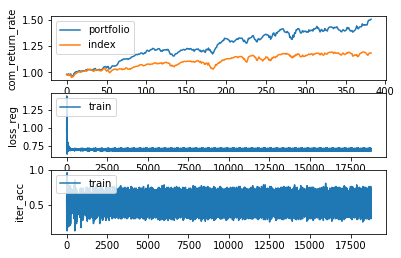

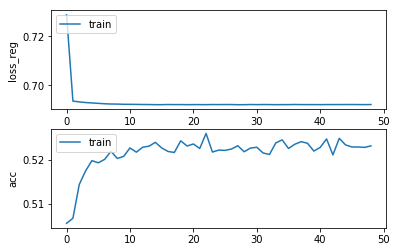

Epochs :  48 Iterations :  18767 Loss :  0.6921135425256375 ACC :  0.5230840274154673 MCC :  0.045336456892631376 Precision :  0.5254117458251453
mode : validation


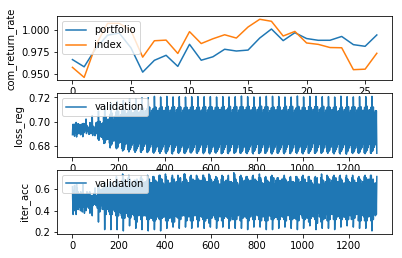

Epochs :  48 Iterations :  27 Loss :  0.6942448836785776 ACC :  0.4971677710612615 MCC :  nan Precision :  0.491227926755393


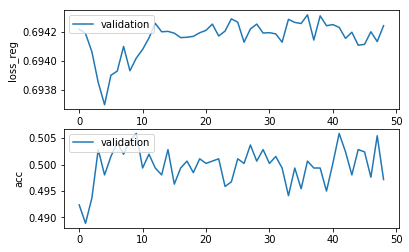

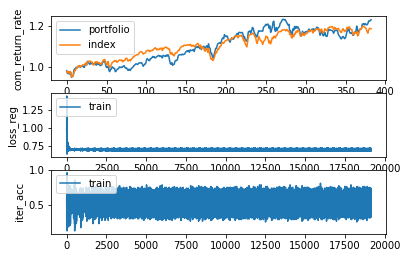

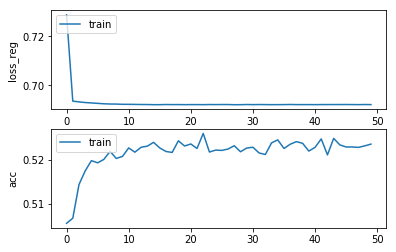

Epochs :  49 Iterations :  19150 Loss :  0.6920881777145844 ACC :  0.5234833520012798 MCC :  0.04625844635742938 Precision :  0.5256468387899371
mode : validation


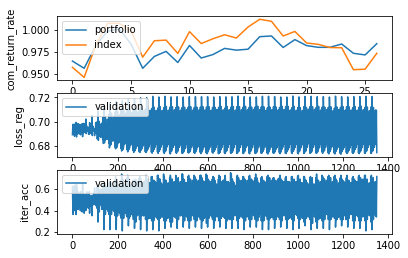

Epochs :  49 Iterations :  27 Loss :  0.6941903697119819 ACC :  0.5006536096334457 MCC :  nan Precision :  0.4923212268838176


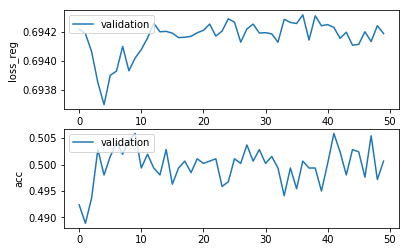

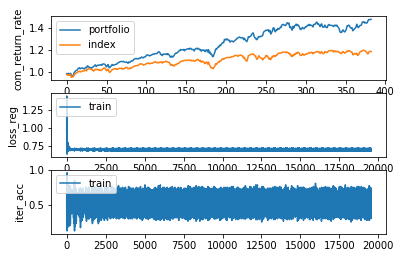

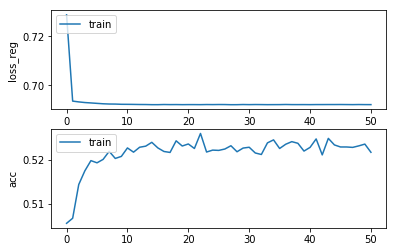

Epochs :  50 Iterations :  19533 Loss :  0.6920776994359089 ACC :  0.5216403173248699 MCC :  0.04219798925262815 Precision :  0.5246335062935131
mode : validation


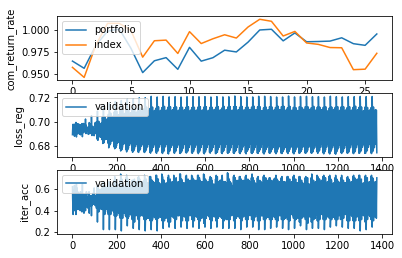

Epochs :  50 Iterations :  27 Loss :  0.6942140724923875 ACC :  0.5006536096334457 MCC :  nan Precision :  0.49315904467194166


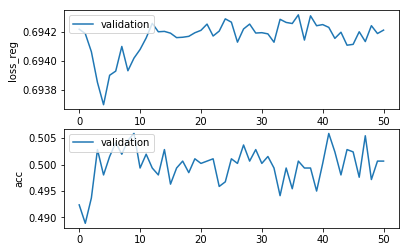

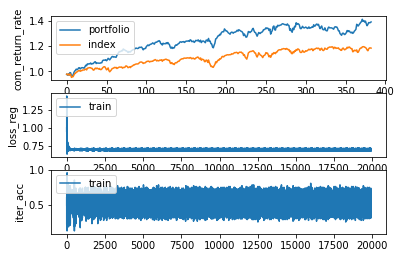

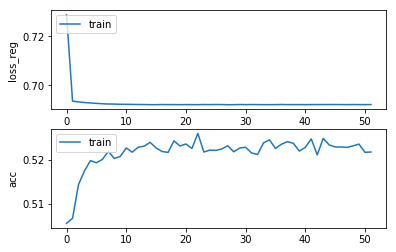

Epochs :  51 Iterations :  19916 Loss :  0.6921130154213768 ACC :  0.5217017518166773 MCC :  0.042788938044110804 Precision :  0.524768873154339
mode : validation


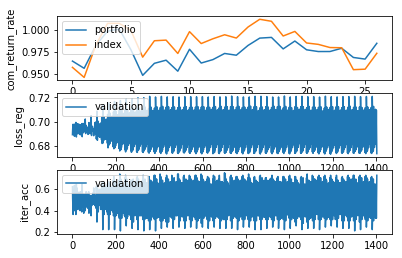

Epochs :  51 Iterations :  27 Loss :  0.6942835295641864 ACC :  0.49847496052583057 MCC :  nan Precision :  0.49319053041162314


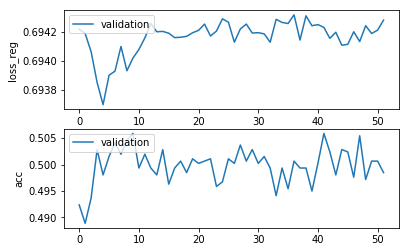

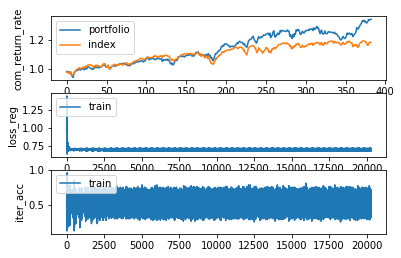

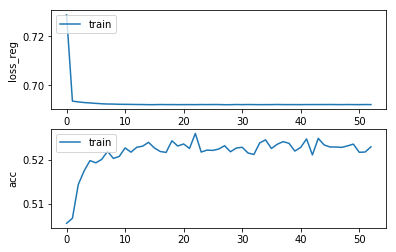

Epochs :  52 Iterations :  20299 Loss :  0.6920907793094844 ACC :  0.5228690075500827 MCC :  0.046177788369488895 Precision :  0.5257193138895863
mode : validation


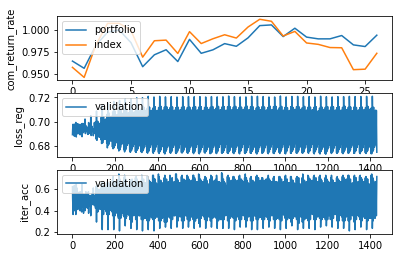

Epochs :  52 Iterations :  27 Loss :  0.6941823915198997 ACC :  0.5028322587410609 MCC :  nan Precision :  0.4944642393125428


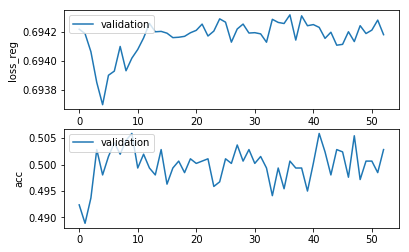

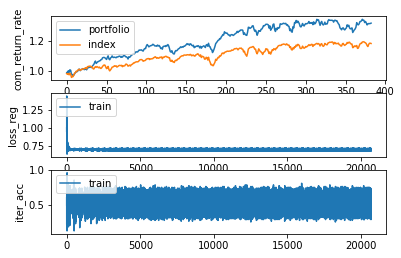

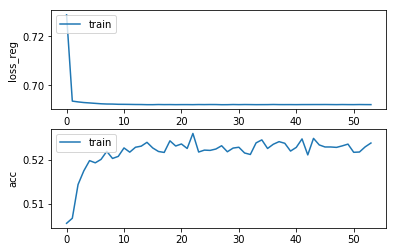

Epochs :  53 Iterations :  20682 Loss :  0.6920774865399453 ACC :  0.5237290901241353 MCC :  0.04644670243029709 Precision :  0.5257205847631313
mode : validation


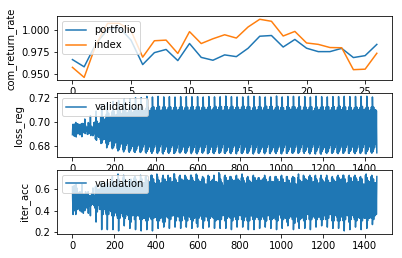

Epochs :  53 Iterations :  27 Loss :  0.6941606358245567 ACC :  0.5041394487575248 MCC :  nan Precision :  0.4942091183254012


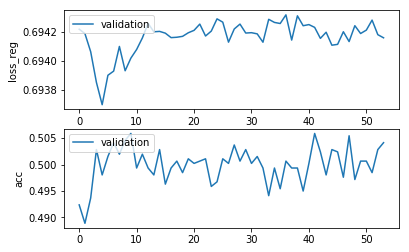

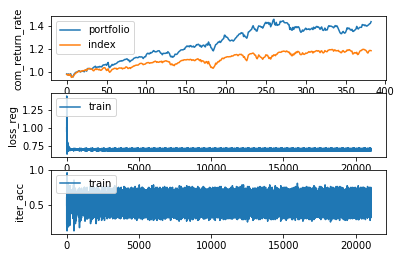

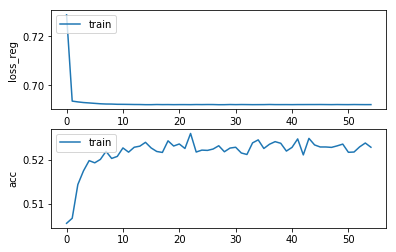

Epochs :  54 Iterations :  21065 Loss :  0.6920832737930138 ACC :  0.5227768551898687 MCC :  0.04382721985436188 Precision :  0.5250840316874318
mode : validation


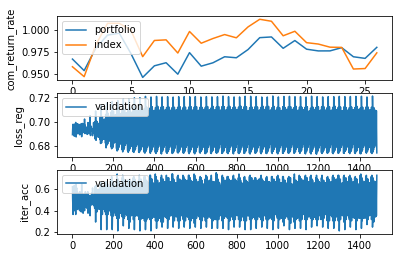

Epochs :  54 Iterations :  27 Loss :  0.6942233708169725 ACC :  0.49891069034735364 MCC :  nan Precision :  0.4930774976533872


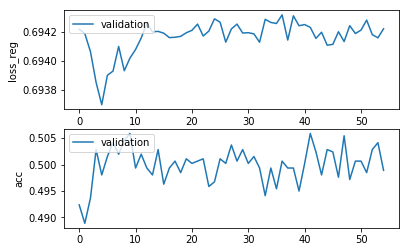

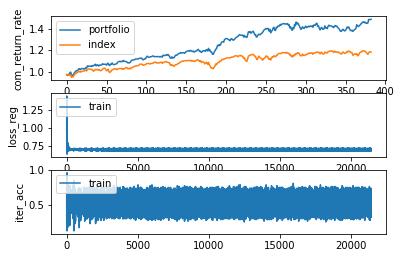

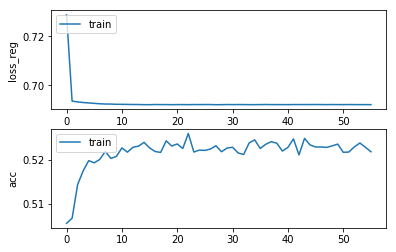

Epochs :  55 Iterations :  21448 Loss :  0.6920639436798992 ACC :  0.521763186230672 MCC :  0.043407921559103176 Precision :  0.5247097130641146
mode : validation


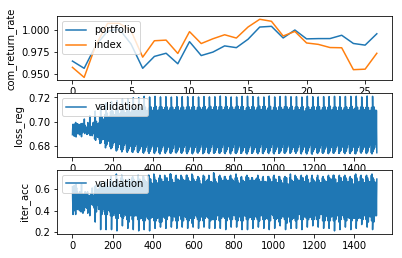

Epochs :  55 Iterations :  27 Loss :  0.6941654108188771 ACC :  0.4971677710612615 MCC :  nan Precision :  0.4932357242537869


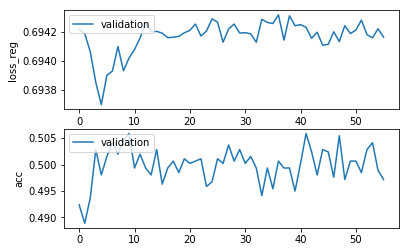

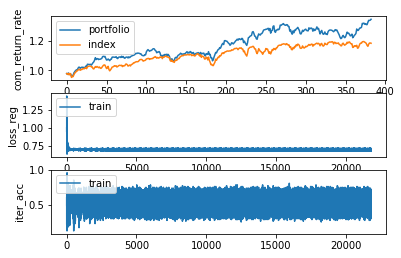

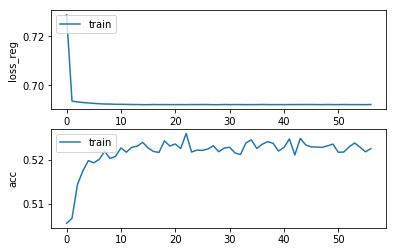

Epochs :  56 Iterations :  21831 Loss :  0.6921230168628941 ACC :  0.5224696827308316 MCC :  0.04376214947466381 Precision :  0.5251547875023853
mode : validation


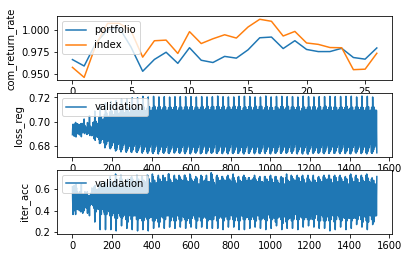

Epochs :  56 Iterations :  27 Loss :  0.6942354308234321 ACC :  0.4976035014346794 MCC :  nan Precision :  0.49327111464959605


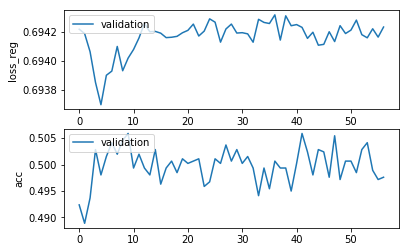

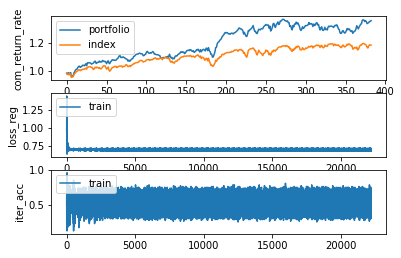

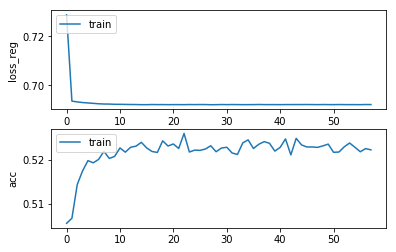

Epochs :  57 Iterations :  22214 Loss :  0.6920956499271542 ACC :  0.5221932274398854 MCC :  0.04367894755038688 Precision :  0.5249890557322505
mode : validation


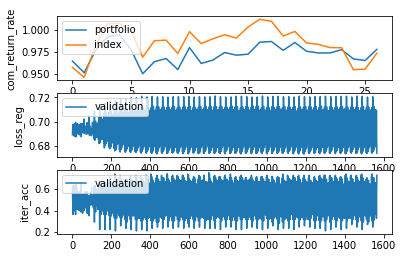

Epochs :  57 Iterations :  27 Loss :  0.6941871907975938 ACC :  0.5002178798119227 MCC :  nan Precision :  0.4914676658809185


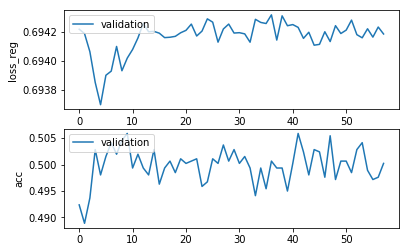

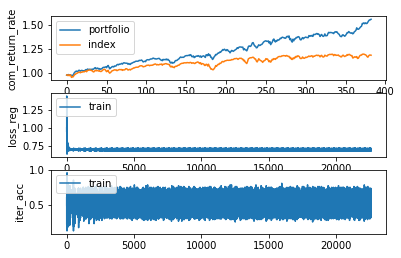

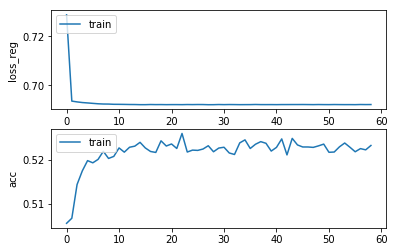

Epochs :  58 Iterations :  22597 Loss :  0.6921102624026665 ACC :  0.5231761798534941 MCC :  0.04515107059665875 Precision :  0.5253527013696827
mode : validation


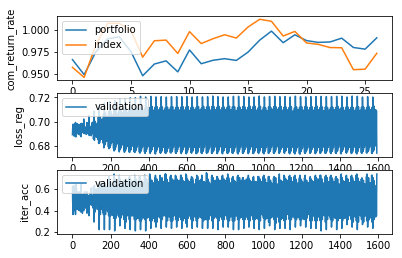

Epochs :  58 Iterations :  27 Loss :  0.6943139235178629 ACC :  0.49673204123973846 MCC :  nan Precision :  0.49054860668601813


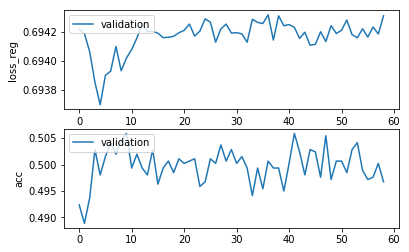

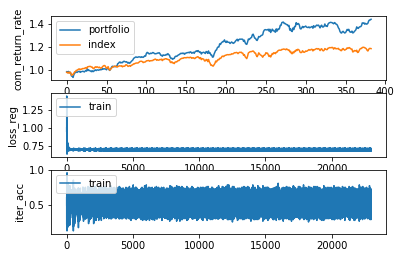

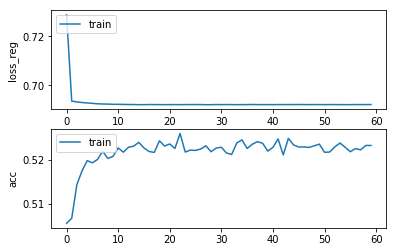

Epochs :  59 Iterations :  22980 Loss :  0.6921120578564178 ACC :  0.523176179386617 MCC :  0.04506457842462125 Precision :  0.5255772915690671
mode : validation


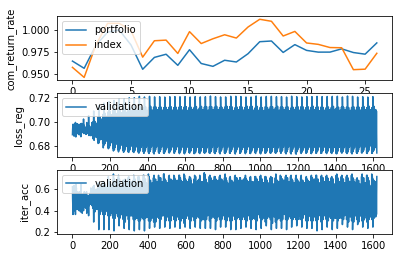

Epochs :  59 Iterations :  27 Loss :  0.6941677155318083 ACC :  0.50413944820563 MCC :  nan Precision :  0.4943053783090026


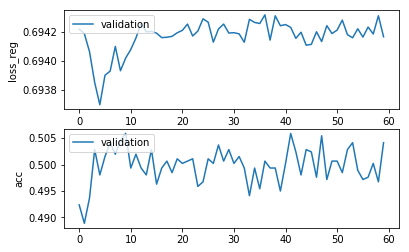

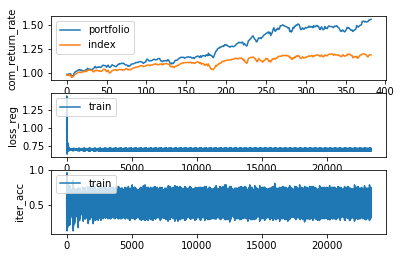

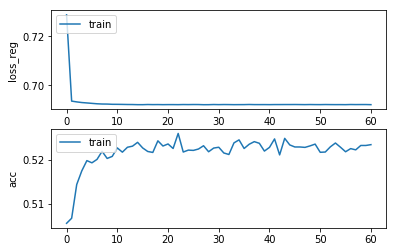

Epochs :  60 Iterations :  23363 Loss :  0.6920594355144949 ACC :  0.5233604830954778 MCC :  0.047524329098598064 Precision :  0.5259887413085285
mode : validation


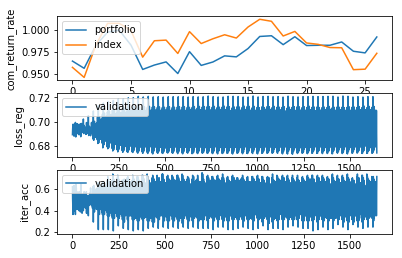

Epochs :  60 Iterations :  27 Loss :  0.6942064166069031 ACC :  0.50413944820563 MCC :  nan Precision :  0.4958380173753809


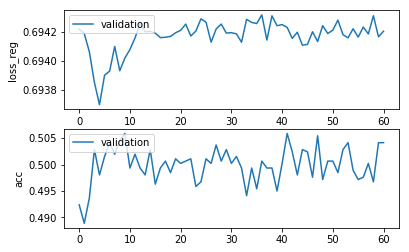

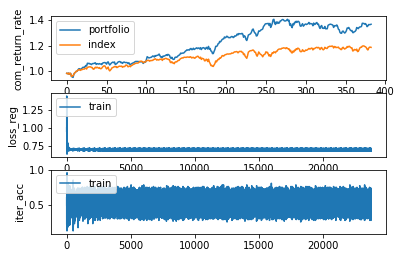

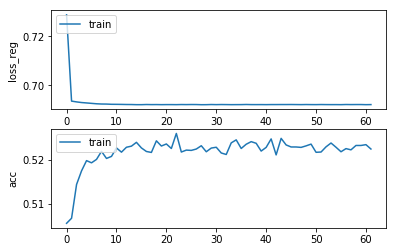

Epochs :  61 Iterations :  23746 Loss :  0.69209010778457 ACC :  0.5223775309931205 MCC :  0.044273886359394006 Precision :  0.5251862797010739
mode : validation


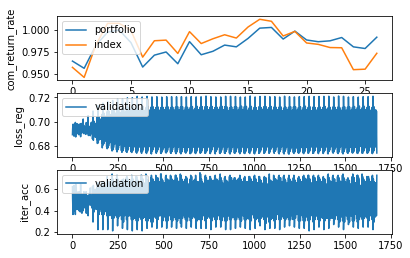

Epochs :  61 Iterations :  27 Loss :  0.6941854556401571 ACC :  0.49673204123973846 MCC :  nan Precision :  0.4914726348662818


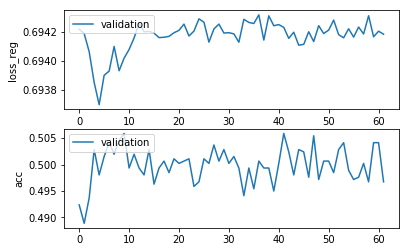

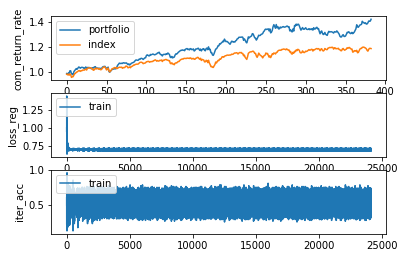

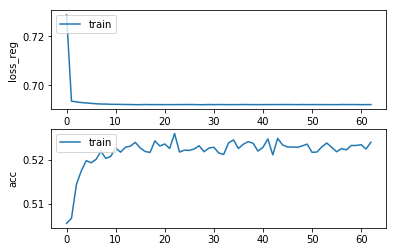

Epochs :  62 Iterations :  24129 Loss :  0.6920885256936594 ACC :  0.5239133935217446 MCC :  0.04781186415442428 Precision :  0.5263050316781895
mode : validation


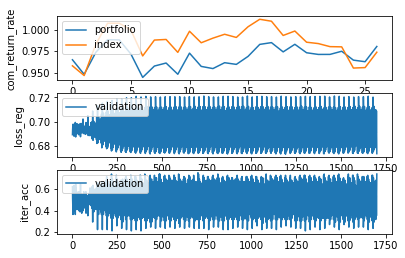

Epochs :  62 Iterations :  27 Loss :  0.6941127556341665 ACC :  0.5023965289195379 MCC :  nan Precision :  0.4943870823416445


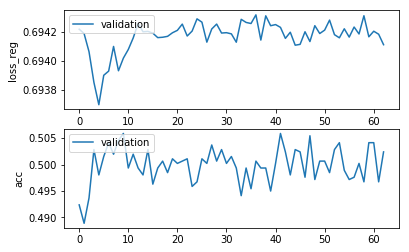

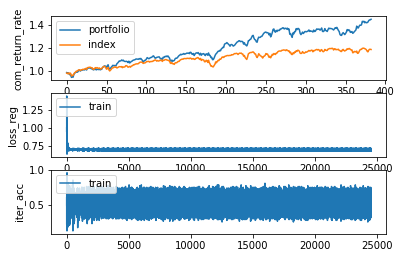

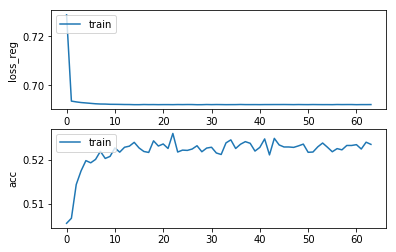

Epochs :  63 Iterations :  24512 Loss :  0.6921006546941812 ACC :  0.523421917470566 MCC :  0.04703483241807801 Precision :  0.5258453049534061
mode : validation


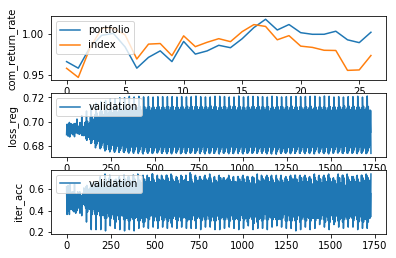

Epochs :  63 Iterations :  27 Loss :  0.6941972330764488 ACC :  0.5002178798119227 MCC :  nan Precision :  0.4923701530529393


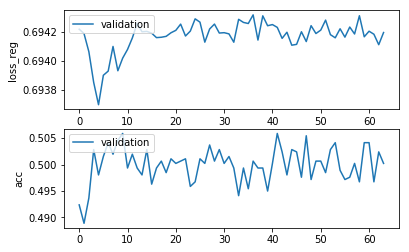

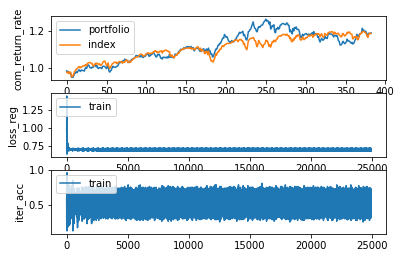

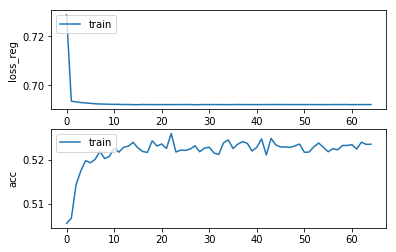

Epochs :  64 Iterations :  24895 Loss :  0.6921091853171665 ACC :  0.5234526347553761 MCC :  0.04611695028112608 Precision :  0.5257921156670422
mode : validation


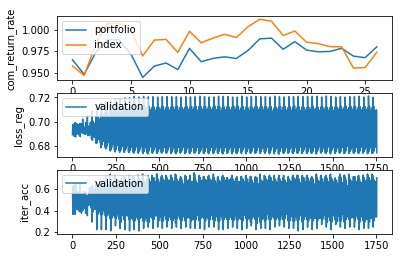

Epochs :  64 Iterations :  27 Loss :  0.6941086760273686 ACC :  0.5028322587410609 MCC :  nan Precision :  0.494358002587601


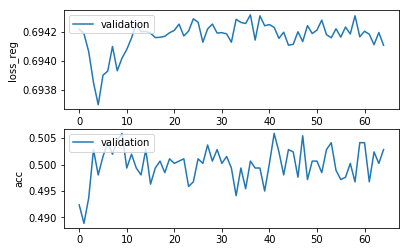

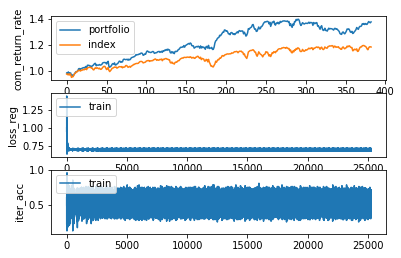

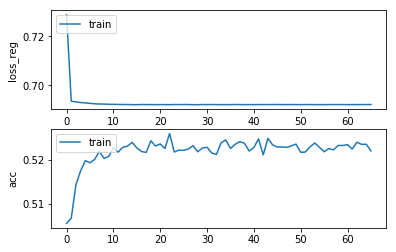

Epochs :  65 Iterations :  25278 Loss :  0.6921161322929841 ACC :  0.5219474897060942 MCC :  0.04488914875437046 Precision :  0.5252375754116798
mode : validation


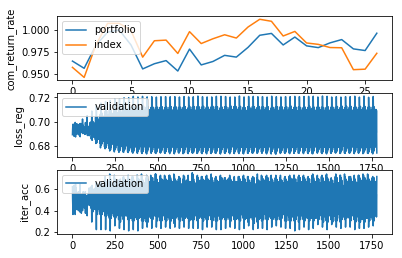

Epochs :  65 Iterations :  27 Loss :  0.6943003756028635 ACC :  0.5019607996499097 MCC :  nan Precision :  0.4933788821929031


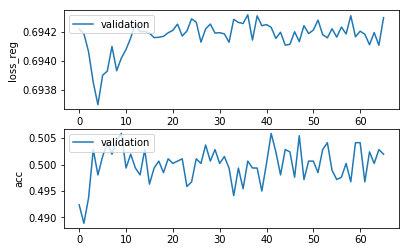

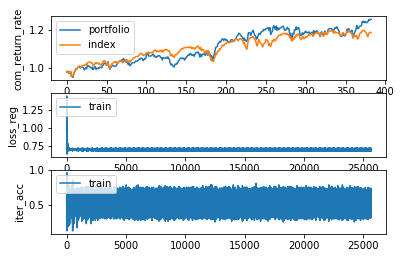

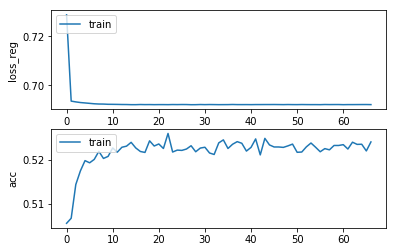

Epochs :  66 Iterations :  25661 Loss :  0.6920825797023723 ACC :  0.5239748277801135 MCC :  0.04801253328910195 Precision :  0.5260593800637725
mode : validation


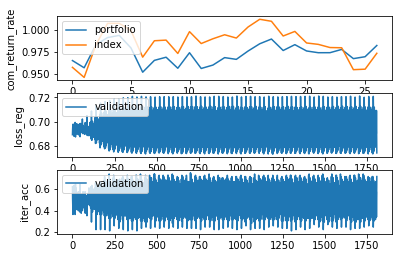

Epochs :  66 Iterations :  27 Loss :  0.6942076771347611 ACC :  0.49629631141821545 MCC :  nan Precision :  0.4937631182924465


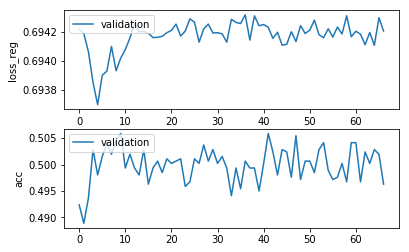

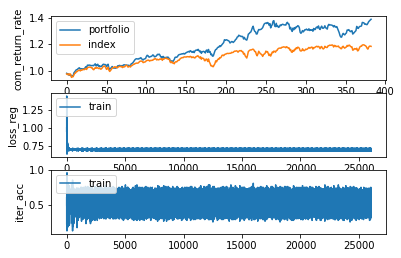

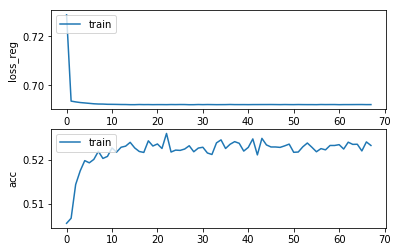

Epochs :  67 Iterations :  26044 Loss :  0.6920893684068485 ACC :  0.5231761799313069 MCC :  0.04626723727139623 Precision :  0.5258809426123418
mode : validation


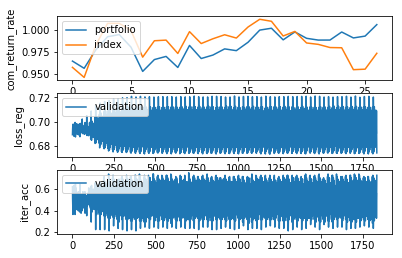

Epochs :  67 Iterations :  27 Loss :  0.6941553817854987 ACC :  0.5006536096334457 MCC :  nan Precision :  0.49329096685957025


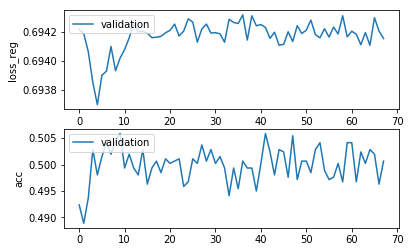

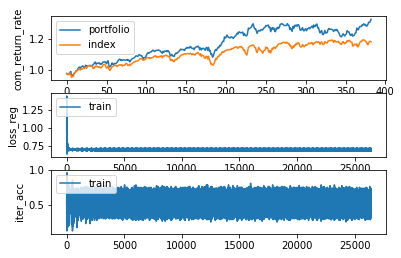

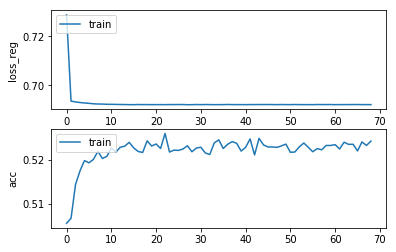

Epochs :  68 Iterations :  26427 Loss :  0.6920821016202086 ACC :  0.5241591313333487 MCC :  0.04690811526764053 Precision :  0.5260018624423689
mode : validation


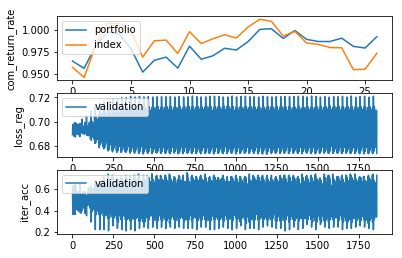

Epochs :  68 Iterations :  27 Loss :  0.6942212007663868 ACC :  0.5010893394549688 MCC :  nan Precision :  0.49471852955994783


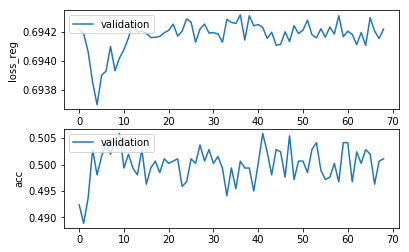

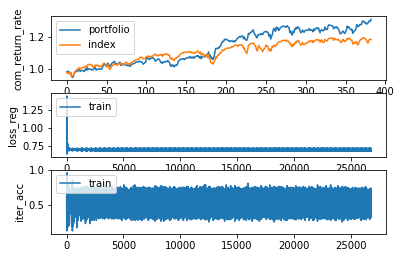

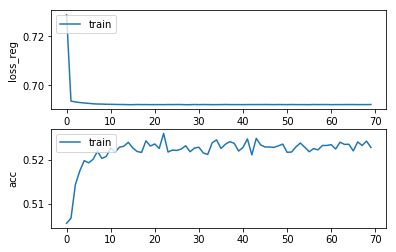

Epochs :  69 Iterations :  26810 Loss :  0.6921232616621271 ACC :  0.5227154213205641 MCC :  0.045210458028681004 Precision :  0.525311700844111
mode : validation


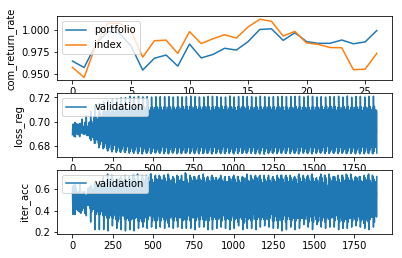

Epochs :  69 Iterations :  27 Loss :  0.6941984450375592 ACC :  0.5006536096334457 MCC :  nan Precision :  0.4922656757688081


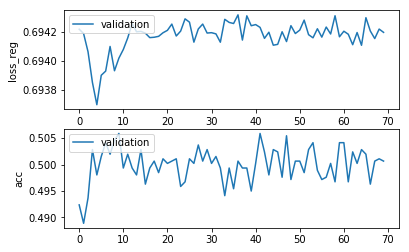

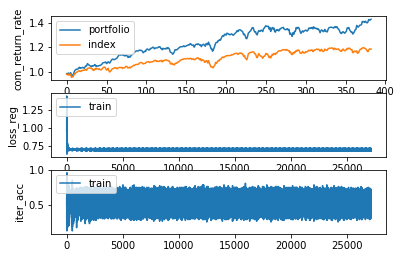

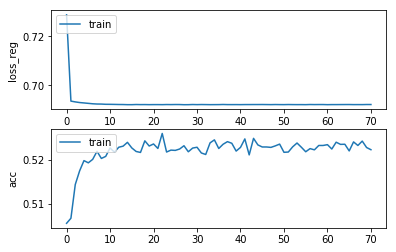

Epochs :  70 Iterations :  27193 Loss :  0.6921169090208745 ACC :  0.5222239450748534 MCC :  0.043152933876156596 Precision :  0.5248011642138112
mode : validation


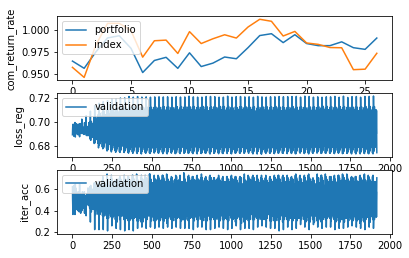

Epochs :  70 Iterations :  27 Loss :  0.6942344572809007 ACC :  0.49847496052583057 MCC :  nan Precision :  0.49381985170421777


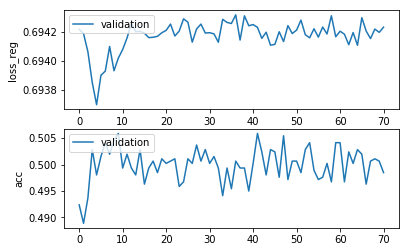

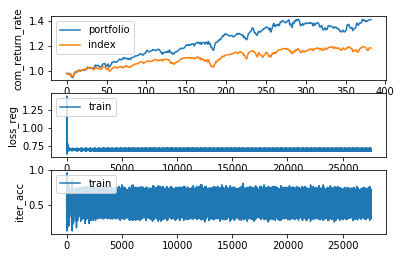

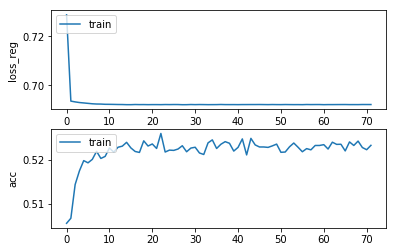

Epochs :  71 Iterations :  27576 Loss :  0.6921116831097217 ACC :  0.5232068970993978 MCC :  0.04601130935220004 Precision :  0.5255285508531893
mode : validation


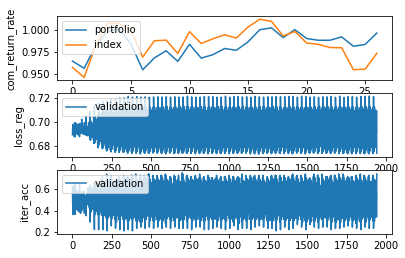

Epochs :  71 Iterations :  27 Loss :  0.6941771507263184 ACC :  0.49978214999039966 MCC :  nan Precision :  0.49313672976913275


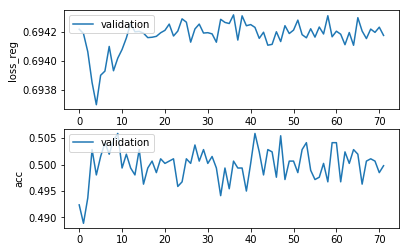

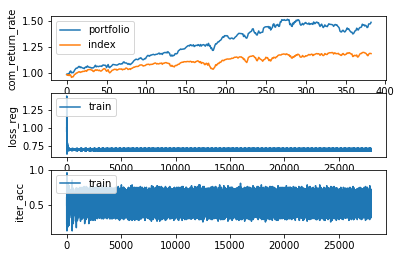

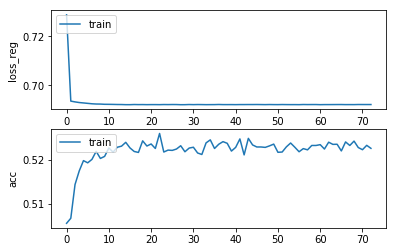

Epochs :  72 Iterations :  27959 Loss :  0.6921131931459312 ACC :  0.522531117222639 MCC :  0.046593246171609606 Precision :  0.5258099690916177
mode : validation


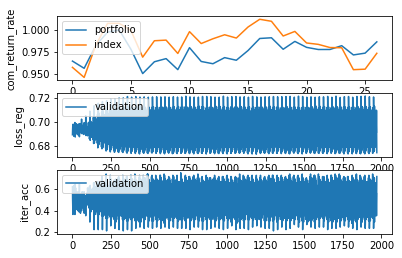

Epochs :  72 Iterations :  27 Loss :  0.6942506278002704 ACC :  0.49847496052583057 MCC :  nan Precision :  0.49203143103255165


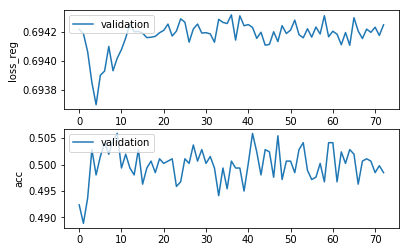

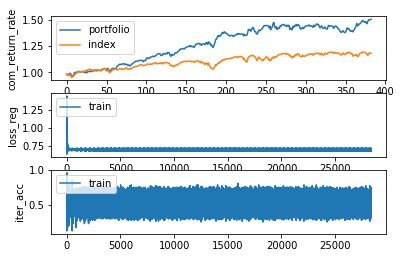

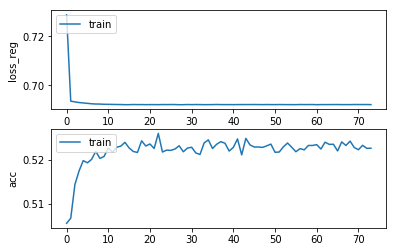

Epochs :  73 Iterations :  28342 Loss :  0.6920759323060357 ACC :  0.5225618350132327 MCC :  0.04303963849316145 Precision :  0.524788827229262
mode : validation


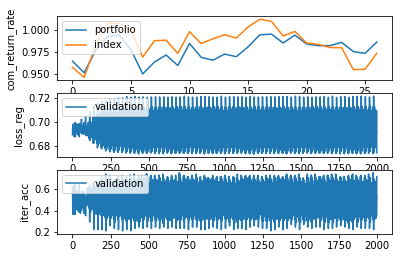

Epochs :  73 Iterations :  27 Loss :  0.6941726936234368 ACC :  0.5010893394549688 MCC :  nan Precision :  0.4922757185995579


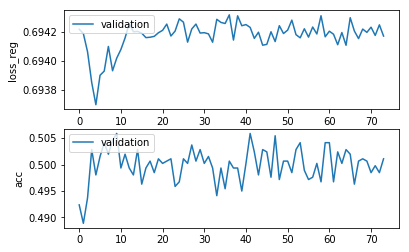

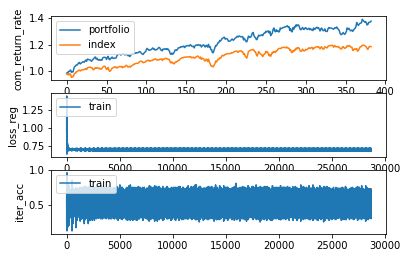

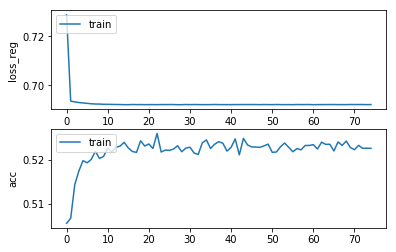

Epochs :  74 Iterations :  28725 Loss :  0.6921062527063933 ACC :  0.522531117222639 MCC :  0.04573348253784828 Precision :  0.5257580697624008
mode : validation


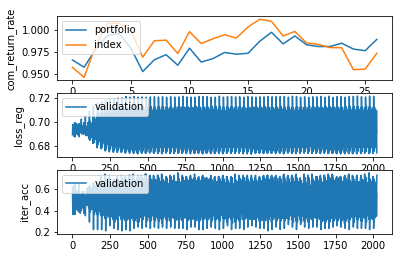

Epochs :  74 Iterations :  27 Loss :  0.6942055181220725 ACC :  0.5028322587410609 MCC :  nan Precision :  0.4939529200394948


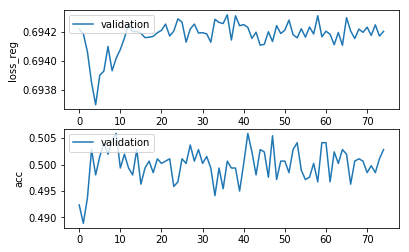

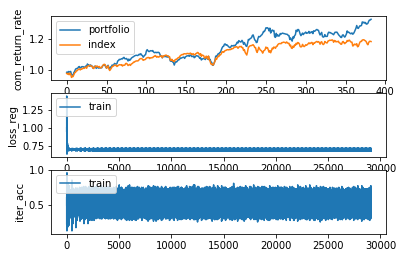

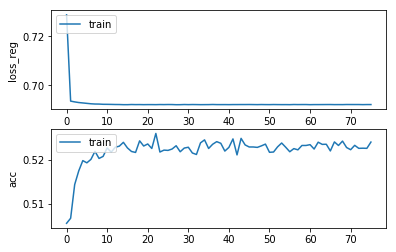

Epochs :  75 Iterations :  29108 Loss :  0.6921032768316742 ACC :  0.5239441107676484 MCC :  0.04833175977217836 Precision :  0.5264850161026181
mode : validation


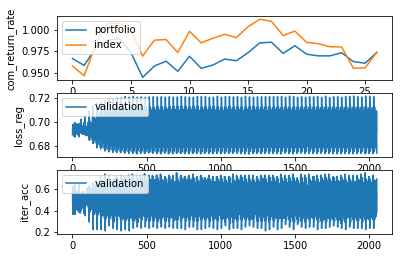

Epochs :  75 Iterations :  27 Loss :  0.6941364275084602 ACC :  0.5015250692764918 MCC :  nan Precision :  0.4940745193097327


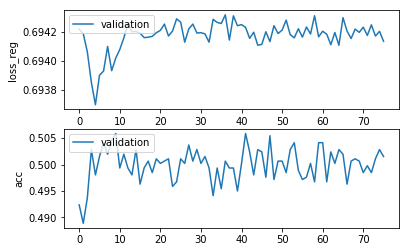

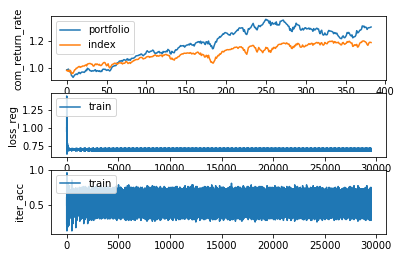

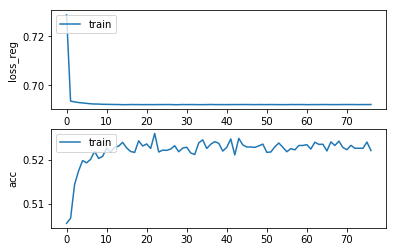

Epochs :  76 Iterations :  29491 Loss :  0.692119310947996 ACC :  0.522039641132554 MCC :  0.0434277748531606 Precision :  0.5248799344412886
mode : validation


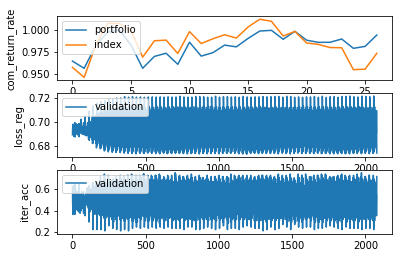

Epochs :  76 Iterations :  27 Loss :  0.6942265431086222 ACC :  0.5023965289195379 MCC :  nan Precision :  0.49283302340794494


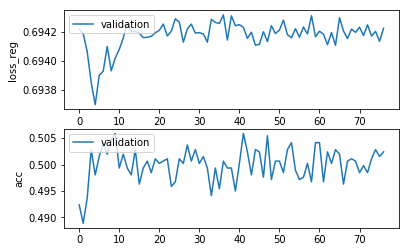

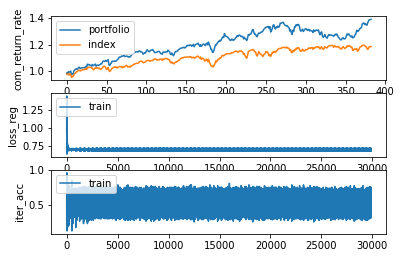

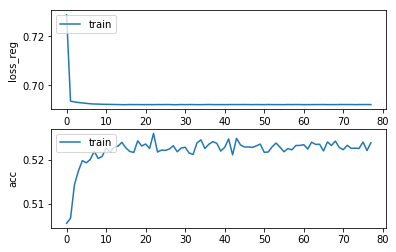

Epochs :  77 Iterations :  29874 Loss :  0.6920930853711719 ACC :  0.5237905244603169 MCC :  0.04571935924195001 Precision :  0.5256522537911841
mode : validation


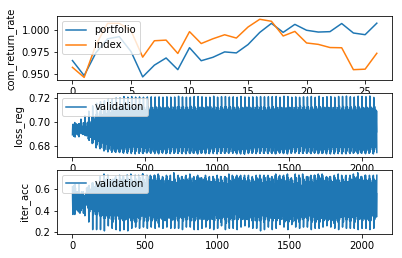

Epochs :  77 Iterations :  27 Loss :  0.6941900606508609 ACC :  0.50413944820563 MCC :  nan Precision :  0.49423960679107243


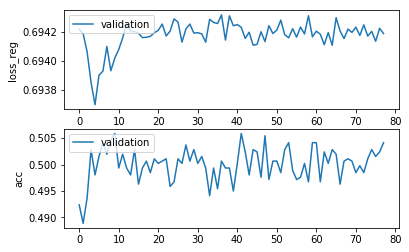

KeyboardInterrupt: 

In [19]:
model.train()

epoch :  0 time_idx :  0 loss_reg :  tensor(0.6780, grad_fn=<AddBackward0>) acc :  tensor(0.6824) mcc :  tensor(0.1035) precision :  tensor(0.9153)


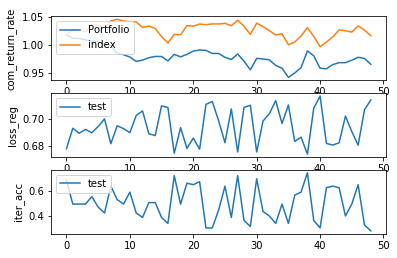

Epochs :  0 Iterations :  49 Loss :  0.6941442939699912 ACC :  0.4977191005434309 MCC :  0.01680460195674808 Precision :  0.47836167160041476


In [20]:
model.test()

In [ ]:
model.train()

In [ ]:
model.test()

In [ ]:
model.train() # dropout 없음, epochs = 5

In [ ]:
model.train() # dropout 0.15 적용

In [ ]:
model.test()

In [ ]:
model.test()

In [ ]:
model.train()

In [ ]:
model.train()

In [ ]:
model.test()

In [ ]:
model.epoch_losses

In [ ]:
model.train()

In [ ]:
model.test()

In [ ]:
model.return_rate.shape

In [ ]:
ㄴmodel.train()

In [ ]:
model.train()